# Customer Segmentation using Clustering Algorithms

---

## 1.0. Introduction

Customer Personality Analysis is a detailed analysis of a company’s ideal customers. It helps a business to better understand its customers and makes it easier for them to modify products according to the specific needs, behaviors and concerns of different types of customers.

Customer personality analysis helps a business to modify its product based on its target customers from different types of customer segments. For example, instead of spending money to market a new product to every customer in the company’s database, a company can analyze which customer segment is most likely to buy the product and then market the product only on that particular segment.

Data is sourced from https://thecleverprogrammer.com/2021/02/08/customer-personality-analysis-with-python/

## 2.0. Importing Libraries

In [ ]:
# libraries required for data analysis, visualization and data preprocessing
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline
import math  # For mathematical operations
import scipy.stats as stats # statistics module
from scipy.stats import boxcox
from scipy.stats import mstats
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from scipy.stats.mstats import winsorize

In [ ]:
# libraries required for cluster analyis
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA

## 3.0. Importing Data




In [333]:
# Download latest data version from kaggle
# !pip install kaggle

!kaggle datasets download -d imakash3011/customer-personality-analysis

Dataset URL: https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis
License(s): CC0-1.0
customer-personality-analysis.zip: Skipping, found more recently modified local copy (use --force to force download)


In [334]:
data = pd.read_csv('/Users/h.nderitu/Advanced Machine Learning/advml-week2project/customer_data/marketing_campaign.csv', delimiter='\t')

# Display the first few rows
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [335]:
# # read marketing campaign csv file
# # Assuming the file is in the current working directory and named 'marketing_campaign.csv'
# # Replace with the actual path if it's different.
# try:
#     data = pd.read_csv('marketing_campaign.csv', delimiter='\t')
#     print(data.head())  # Display the first few rows of the dataframe
# except FileNotFoundError:
#     print("Error: marketing_campaign.csv not found in the current directory.")
# except pd.errors.ParserError:
#     print("Error: Could not parse the CSV file. Please check the delimiter.")


In [336]:
# get dataset information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

Data contains:
- 29 columns
- 2240 rows

In [337]:
# renaming of the columns
data_renamed = data.rename(columns = {
'Dt_Customer': 'date_enrollment',
'Recency': 'days_recent_purchase',
'Income': 'yearly_income',
'MntWines': 'winespend' ,
'MntFruits': 'fruitspend',
'MntMeatProducts': 'meatprodspend',
'MntFishProducts': 'fishprodspend',
'MntSweetProducts': 'sweetprodspend',
'MntGoldProds': 'premiumprodspend',
'Complain': 'complaints',
'Response': 'cmpresponse'})


#Display the first few rows to confirm the changes
data_renamed.head(5)

,ID,Year_Birth,Education,Marital_Status,yearly_income,Kidhome,Teenhome,date_enrollment,days_recent_purchase,winespend,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,complaints,Z_CostContact,Z_Revenue,cmpresponse
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [338]:
#Display the first few rows to confirm the changes
data_renamed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ID                    2240 non-null   int64  
 1   Year_Birth            2240 non-null   int64  
 2   Education             2240 non-null   object 
 3   Marital_Status        2240 non-null   object 
 4   yearly_income         2216 non-null   float64
 5   Kidhome               2240 non-null   int64  
 6   Teenhome              2240 non-null   int64  
 7   date_enrollment       2240 non-null   object 
 8   days_recent_purchase  2240 non-null   int64  
 9   winespend             2240 non-null   int64  
 10  fruitspend            2240 non-null   int64  
 11  meatprodspend         2240 non-null   int64  
 12  fishprodspend         2240 non-null   int64  
 13  sweetprodspend        2240 non-null   int64  
 14  premiumprodspend      2240 non-null   int64  
 15  NumDealsPurchases    

In [339]:
# Convert from object dtype to datetype for the Dt_Customer column
data_renamed['date_enrollment'] = pd.to_datetime(data_renamed['date_enrollment'], format='%d-%m-%Y')

data_renamed.info()  # Display the information of the dataset to confirm the change

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   ID                    2240 non-null   int64         
 1   Year_Birth            2240 non-null   int64         
 2   Education             2240 non-null   object        
 3   Marital_Status        2240 non-null   object        
 4   yearly_income         2216 non-null   float64       
 5   Kidhome               2240 non-null   int64         
 6   Teenhome              2240 non-null   int64         
 7   date_enrollment       2240 non-null   datetime64[ns]
 8   days_recent_purchase  2240 non-null   int64         
 9   winespend             2240 non-null   int64         
 10  fruitspend            2240 non-null   int64         
 11  meatprodspend         2240 non-null   int64         
 12  fishprodspend         2240 non-null   int64         
 13  sweetprodspend    

In [340]:
numerical_columns = data_renamed.select_dtypes(include=[np.number]).columns.tolist()
num_numerical_columns = len(numerical_columns)
print(f"Numerical columns: {numerical_columns}")
print(f"Number of numerical columns: {num_numerical_columns}")

Numerical columns: ['ID', 'Year_Birth', 'yearly_income', 'Kidhome', 'Teenhome', 'days_recent_purchase', 'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend', 'sweetprodspend', 'premiumprodspend', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'complaints', 'Z_CostContact', 'Z_Revenue', 'cmpresponse']
Number of numerical columns: 26


In [341]:
categorical_columns = data_renamed.select_dtypes(include=['object']).columns.tolist()
num_categorical_columns = len(categorical_columns)
print(f"Categorical columns: {categorical_columns}")
print(f"Number of categorical columns: {num_categorical_columns}")

Categorical columns: ['Education', 'Marital_Status']
Number of categorical columns: 2


## 4.0. Exploratory Data Analysis

### 4.1. Missingness

In [342]:
missing_percentage = data_renamed.isnull().mean() * 100
print(missing_percentage)

ID                      0.000000
Year_Birth              0.000000
Education               0.000000
Marital_Status          0.000000
yearly_income           1.071429
Kidhome                 0.000000
Teenhome                0.000000
date_enrollment         0.000000
days_recent_purchase    0.000000
winespend               0.000000
fruitspend              0.000000
meatprodspend           0.000000
fishprodspend           0.000000
sweetprodspend          0.000000
premiumprodspend        0.000000
NumDealsPurchases       0.000000
NumWebPurchases         0.000000
NumCatalogPurchases     0.000000
NumStorePurchases       0.000000
NumWebVisitsMonth       0.000000
AcceptedCmp3            0.000000
AcceptedCmp4            0.000000
AcceptedCmp5            0.000000
AcceptedCmp1            0.000000
AcceptedCmp2            0.000000
complaints              0.000000
Z_CostContact           0.000000
Z_Revenue               0.000000
cmpresponse             0.000000
dtype: float64


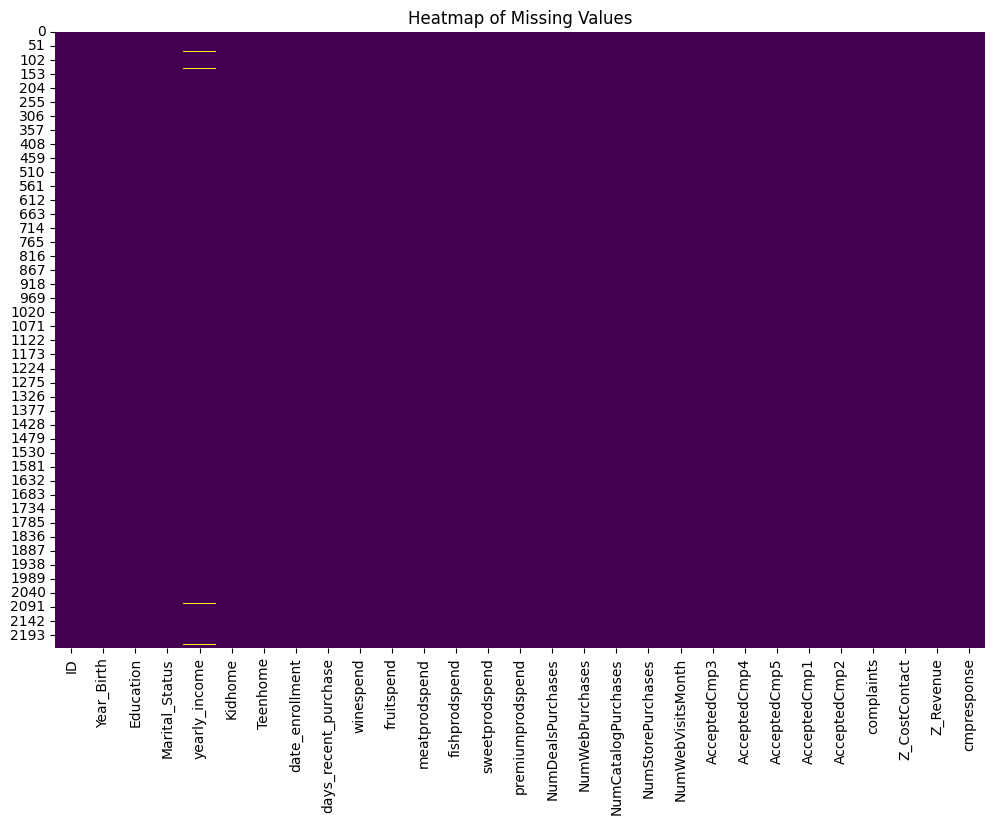

In [343]:
plt.figure(figsize=(12, 8))
sns.heatmap(data_renamed.isnull(), cbar=False, cmap='viridis')
plt.title('Heatmap of Missing Values')
plt.show()

In [344]:
# Delete rows with missing data on income as only 24 columns (1% of the data) is missing vaues
data_cleaned = data_renamed.dropna()
data_cleaned.info()  # Display the information of the cleaned dataset

<class 'pandas.core.frame.DataFrame'>
Index: 2216 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   ID                    2216 non-null   int64         
 1   Year_Birth            2216 non-null   int64         
 2   Education             2216 non-null   object        
 3   Marital_Status        2216 non-null   object        
 4   yearly_income         2216 non-null   float64       
 5   Kidhome               2216 non-null   int64         
 6   Teenhome              2216 non-null   int64         
 7   date_enrollment       2216 non-null   datetime64[ns]
 8   days_recent_purchase  2216 non-null   int64         
 9   winespend             2216 non-null   int64         
 10  fruitspend            2216 non-null   int64         
 11  meatprodspend         2216 non-null   int64         
 12  fishprodspend         2216 non-null   int64         
 13  sweetprodspend        2

Number of rows reduced to 2,216

### 4.2. Duplicates

In [345]:
duplicate_rows = data_cleaned[data_cleaned.duplicated()]
print(f"Number of duplicate rows: {duplicate_rows.shape[0]}")
if duplicate_rows.shape[0] > 0:
    print("Duplicate rows:")
    print(duplicate_rows)
else:
    print("No duplicate rows found.")

Number of duplicate rows: 0
No duplicate rows found.


In [346]:
data_cleaned.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'yearly_income',
       'Kidhome', 'Teenhome', 'date_enrollment', 'days_recent_purchase',
       'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend',
       'sweetprodspend', 'premiumprodspend', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'complaints', 'Z_CostContact',
       'Z_Revenue', 'cmpresponse'],
      dtype='object')

### 4.3. Summary statistics - numeric columns

In [347]:
# Summary statistics for sociodemographic data of the enrolled customers
socio_demo = data_cleaned[['yearly_income']]
socio_demo.describe()

,yearly_income
count,2216.000000
mean,52247.251354
std,25173.076661
min,1730.000000
25%,35303.000000
50%,51381.500000
75%,68522.000000
max,666666.000000


- Highest yearly household income is 666,666 while lowest yearly household income is 1,730

In [348]:
# Summary statistics for product data of the enrolled customers. i.e amount spent on products in the last 2 years
product = data_cleaned[['winespend', 'fruitspend', 'meatprodspend', 'fishprodspend', 'sweetprodspend', 'premiumprodspend']]
product.describe()

,winespend,fruitspend,meatprodspend,fishprodspend,sweetprodspend,premiumprodspend
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,305.091606,26.356047,166.995939,37.637635,27.028881,43.965253
std,337.327920,39.793917,224.283273,54.752082,41.072046,51.815414
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000
50%,174.500000,8.000000,68.000000,12.000000,8.000000,24.500000
75%,505.000000,33.000000,232.250000,50.000000,33.000000,56.000000
max,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000


1. The product with the highest mean amount spent in the last 2 years is meat products while fruits had the lowest mean amount spent

In [349]:
# Summary statistics for purchasing behaviour of the enrolled customers.
purch_behaviour = data_cleaned[['NumDealsPurchases','days_recent_purchase', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth']]
purch_behaviour.describe()

,NumDealsPurchases,days_recent_purchase,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,2.323556,49.012635,4.085289,2.671029,5.800993,5.319043
std,1.923716,28.948352,2.740951,2.926734,3.250785,2.425359
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,24.000000,2.000000,0.000000,3.000000,3.000000
50%,2.000000,49.000000,4.000000,2.000000,5.000000,6.000000
75%,3.000000,74.000000,6.000000,4.000000,8.000000,7.000000
max,15.000000,99.000000,27.000000,28.000000,13.000000,20.000000


1. Number of purchases made with a discount per customer : Highest = 15, Lowest = 0. mean = 2.3
2. Number of days since customer's last purchase: Longest = 99 days, shortest = 0 days, mean = 49 days
3. Number of purchases made through the company’s website per customer: Highest = 27, Lowest = 0, mean = 4
4. Number of purchases made using a catalogue per customer: Highest = 28, Lowest = 0, mean = 2.7
5. Number of purchases made directly in stores per customer: Highest = 13, lowest = 0, mean = 5.8
6. Number of visits to company’s website in the last month per customer: Highest = 20, lowest = 0, mean = 5.3

In [350]:
# Summary statistics for other data for the enrolled customers.
other = data_cleaned[['Z_CostContact','Z_Revenue']]
other.describe()

,Z_CostContact,Z_Revenue
count,2216.0,2216.0
mean,3.0,11.0
std,0.0,0.0
min,3.0,11.0
25%,3.0,11.0
50%,3.0,11.0
75%,3.0,11.0
max,3.0,11.0


The data for the two columns seems the same, with Z_CostContact having a value of 3 and Z_Revenue having a value of 11. There is no variance in the two columns.

This columns will not contribute much to the model and will be deleted.

### 4.4 Summary Statistics - categorical variables

In [351]:
# Function to create a frequency table
def create_frequency_table(df, column_name):
    freq_table = df[column_name].value_counts().reset_index()
    freq_table.columns = [column_name, 'Count']
    freq_table['Percentage'] = (freq_table['Count'] / freq_table['Count'].sum()) * 100
    return freq_table

# Create a function for creating a bar plot for the categorical features
def plot_categorical_feature(df, column_name):
    """
    Generate a bar plot for a given categorical feature in a DataFrame.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    column_name (str): The name of the categorical column to plot.

    Returns:
    None
    """
    freq_table = create_frequency_table(df, column_name)

    plt.figure(figsize=(8, 4))
    sns.barplot(x=column_name, y='Count', data=freq_table, order=freq_table[column_name])
    plt.title(f'Bar Plot of {column_name}')
    plt.xlabel(column_name)
    plt.ylabel('Count')

    # Annotate the bars with the percentage values
    for index, row in freq_table.iterrows():
        plt.text(index, row['Count'], f"{row['Percentage']:.2f}%", color='black', ha="center")

    plt.tight_layout()
    plt.show()

In [352]:
# education frequency table
education_freq_table = create_frequency_table(data_cleaned, 'Education')
print("Frequency table for Education:")
print(education_freq_table)

Frequency table for Education:
    Education  Count  Percentage
0  Graduation   1116   50.361011
1         PhD    481   21.705776
2      Master    365   16.471119
3    2n Cycle    200    9.025271
4       Basic     54    2.436823


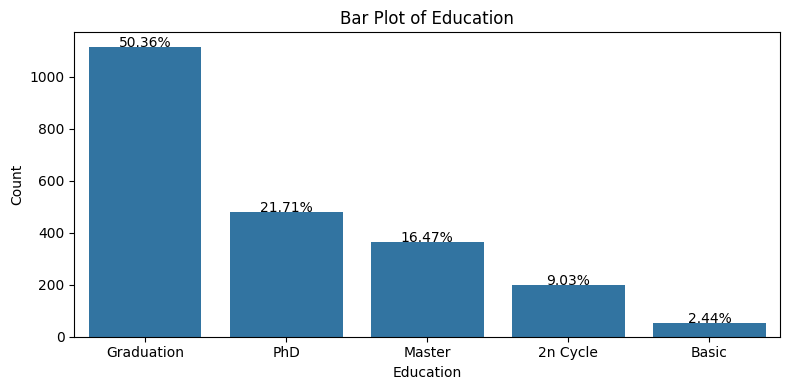

In [353]:
plot_categorical_feature(data_cleaned, 'Education')

- Majority of customers (50.36%) have graduation education level, while the least (2.44%)  have basic education level
- The Master and 2n cycle categories will be merged during data pre-processing as they are the same education level.
- Some of the categories are similar. This will be merged during datapreprocessing.

In [354]:
# marital status frequency table
marital_freq_table = create_frequency_table(data_cleaned, 'Marital_Status')
print("Frequency table for Marital_Status:")
print(marital_freq_table)

Frequency table for Marital_Status:
  Marital_Status  Count  Percentage
0        Married    857   38.673285
1       Together    573   25.857401
2         Single    471   21.254513
3       Divorced    232   10.469314
4          Widow     76    3.429603
5          Alone      3    0.135379
6         Absurd      2    0.090253
7           YOLO      2    0.090253


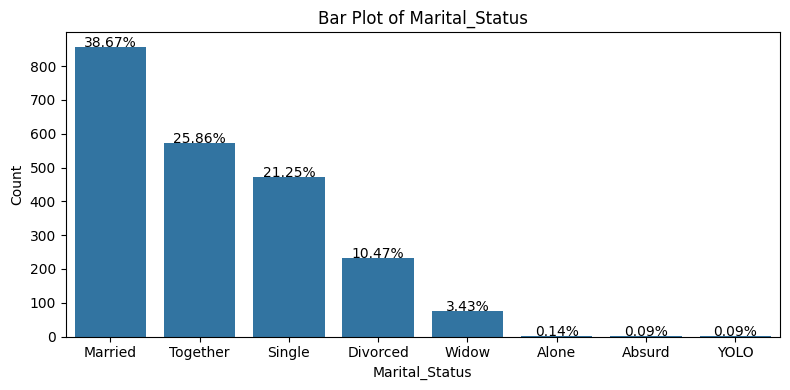

In [355]:
plot_categorical_feature(data_cleaned, 'Marital_Status')

- Majority of customers are married, while the least have absurd and YOLO status
- The categories Married and Together will be meerged during data processing
- The categories Single and Alone will be meerged during data processing
- The categories Absurd and YOLO will be meerged during data processing to other

In [356]:
# 'Kidhome' frequency table
Kidhome_freq_table = create_frequency_table(data_cleaned, 'Kidhome')
print("Frequency table for 'Kidhome:")
print(Kidhome_freq_table)

Frequency table for 'Kidhome:
   Kidhome  Count  Percentage
0        0   1283   57.897112
1        1    887   40.027076
2        2     46    2.075812


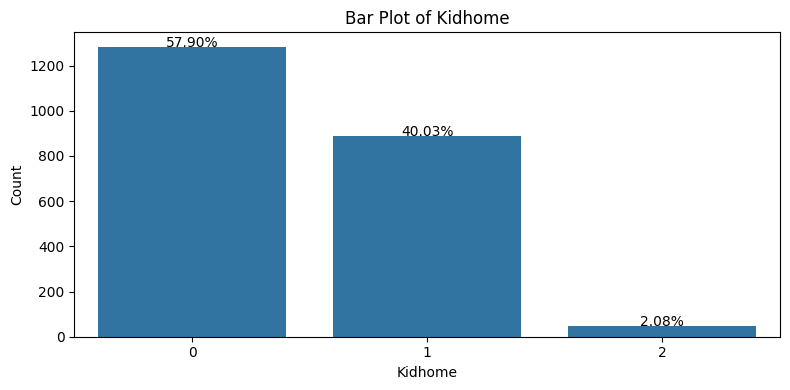

In [357]:
plot_categorical_feature(data_cleaned, 'Kidhome')

Most customers have no children

In [358]:
# 'Teenhome' frequency table
Teenhome_freq_table = create_frequency_table(data_cleaned, 'Teenhome')
print("Frequency table for 'Teenhome:")
print(Teenhome_freq_table)

Frequency table for 'Teenhome:
   Teenhome  Count  Percentage
0         0   1147   51.759928
1         1   1018   45.938628
2         2     51    2.301444


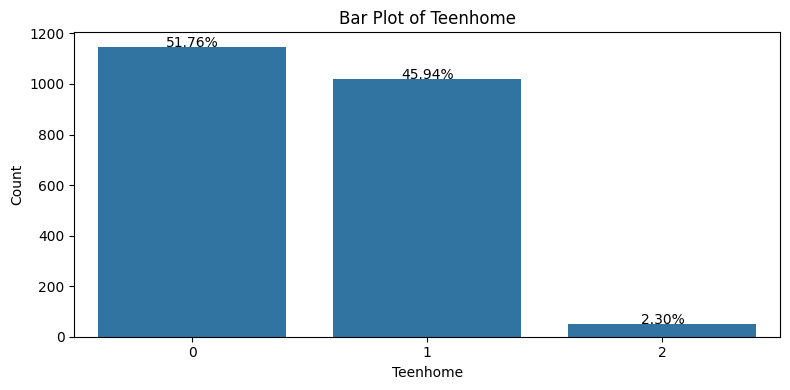

In [359]:
plot_categorical_feature(data_cleaned, 'Teenhome')

Most customers have no teenagers

In [360]:
# 'AcceptedCmp1' frequency table
AcceptedCmp1_freq_table = create_frequency_table(data_cleaned, 'AcceptedCmp1')
print("Frequency table for 'AcceptedCmp1:")
print(AcceptedCmp1_freq_table)

Frequency table for 'AcceptedCmp1:
   AcceptedCmp1  Count  Percentage
0             0   2074   93.592058
1             1    142    6.407942


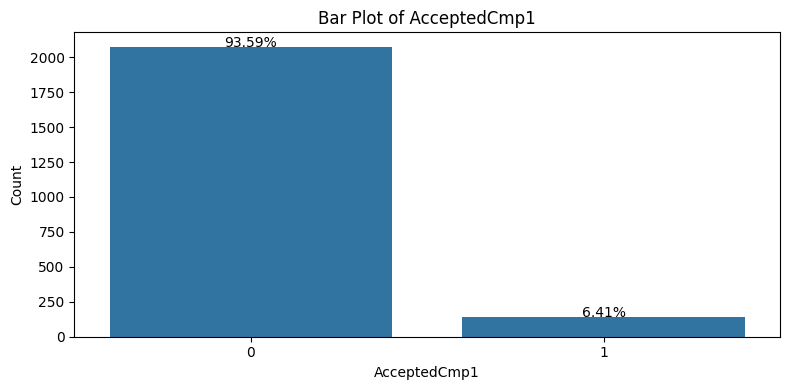

In [361]:
plot_categorical_feature(data_cleaned, 'AcceptedCmp1')

6.41% of customers accepted the offer in the first campaign

In [362]:
# 'AcceptedCmp2' frequency table
AcceptedCmp2_freq_table = create_frequency_table(data_cleaned, 'AcceptedCmp2')
print("Frequency table for 'AcceptedCmp2:")
print(AcceptedCmp2_freq_table)

Frequency table for 'AcceptedCmp2:
   AcceptedCmp2  Count  Percentage
0             0   2186   98.646209
1             1     30    1.353791


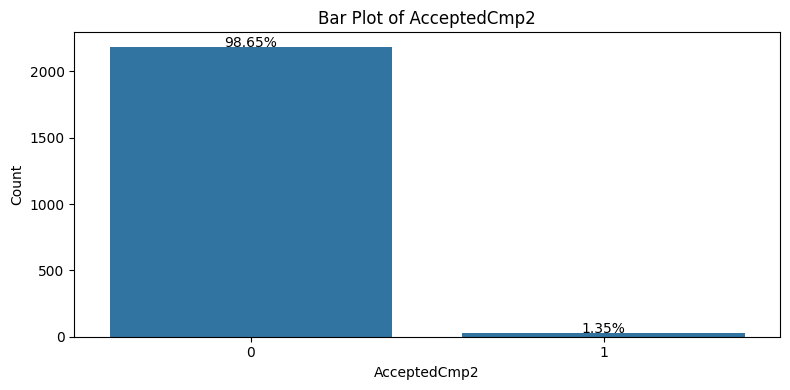

In [363]:
plot_categorical_feature(data_cleaned, 'AcceptedCmp2')

1.35% of customers accepted the offer in the second campaign

In [364]:
# 'AcceptedCmp3' frequency table
acceptedcmp3_freq_table = create_frequency_table(data_cleaned, 'AcceptedCmp3')
print("Frequency table for 'AcceptedCmp3:")
print(acceptedcmp3_freq_table)

Frequency table for 'AcceptedCmp3:
   AcceptedCmp3  Count  Percentage
0             0   2053   92.644404
1             1    163    7.355596


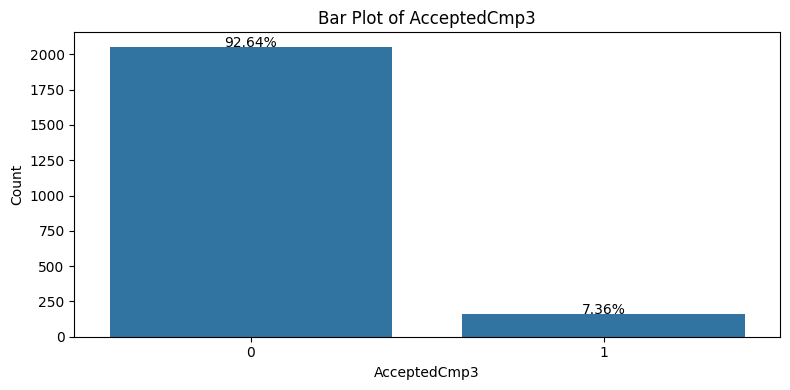

In [365]:
plot_categorical_feature(data_cleaned, 'AcceptedCmp3')

7.36% of customers accepted the offer in the third campaign

In [366]:
# 'AcceptedCmp4' frequency table
AcceptedCmp4_freq_table = create_frequency_table(data_cleaned, 'AcceptedCmp4')
print("Frequency table for 'AcceptedCmp4:")
print(AcceptedCmp4_freq_table)

Frequency table for 'AcceptedCmp4:
   AcceptedCmp4  Count  Percentage
0             0   2052   92.599278
1             1    164    7.400722


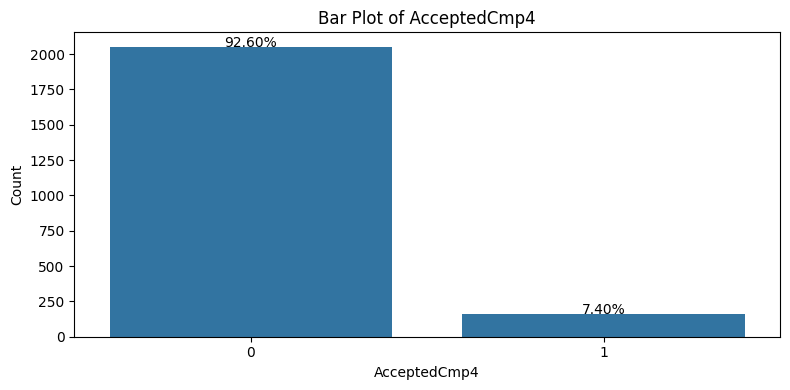

In [367]:
plot_categorical_feature(data_cleaned, 'AcceptedCmp4')

7.4% of customers accepted the offer in the fourth campaign

In [368]:
# 'AcceptedCmp5' frequency table
AcceptedCmp5_freq_table = create_frequency_table(data_cleaned, 'AcceptedCmp5')
print("Frequency table for 'AcceptedCmp5:")
print(AcceptedCmp5_freq_table)

Frequency table for 'AcceptedCmp5:
   AcceptedCmp5  Count  Percentage
0             0   2054   92.689531
1             1    162    7.310469


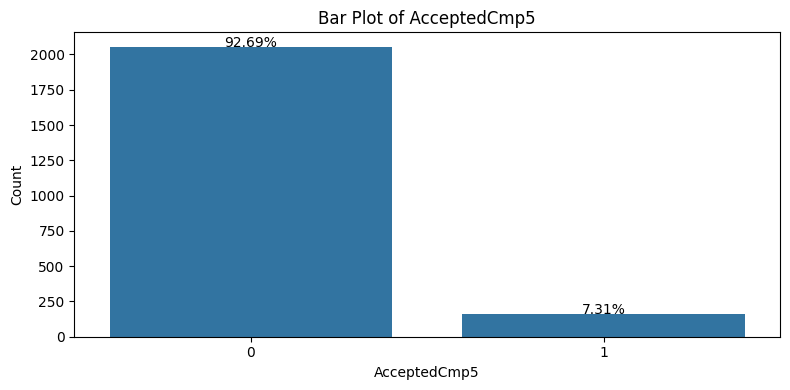

In [369]:
plot_categorical_feature(data_cleaned, 'AcceptedCmp5')

7.3% of customers accepted the offer in the fifth campaign

In [370]:
# 'Response' frequency table
Response_freq_table = create_frequency_table(data_cleaned, 'cmpresponse')
print("Frequency table for 'Response:")
print(Response_freq_table)

Frequency table for 'Response:
   cmpresponse  Count  Percentage
0            0   1883   84.972924
1            1    333   15.027076


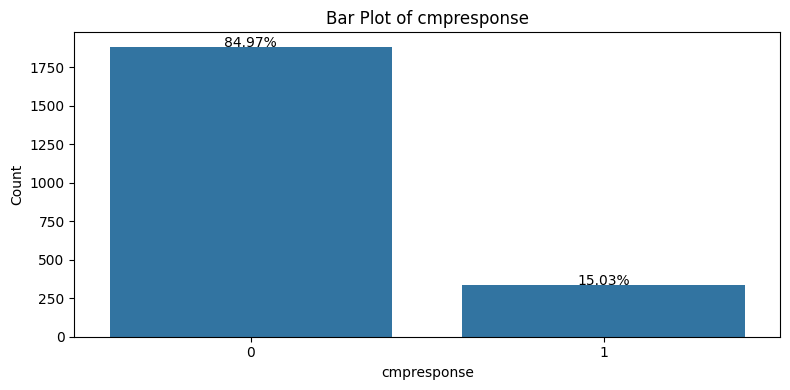

In [371]:
plot_categorical_feature(data_cleaned, 'cmpresponse')

15% of customers accepted the offer in the last campaign

In [372]:
# 'Complain' frequency table
Complain_freq_table = create_frequency_table(data_cleaned, 'complaints')
print("Frequency table for 'Complain:")
print(Complain_freq_table)

Frequency table for 'Complain:
   complaints  Count  Percentage
0           0   2195   99.052347
1           1     21    0.947653


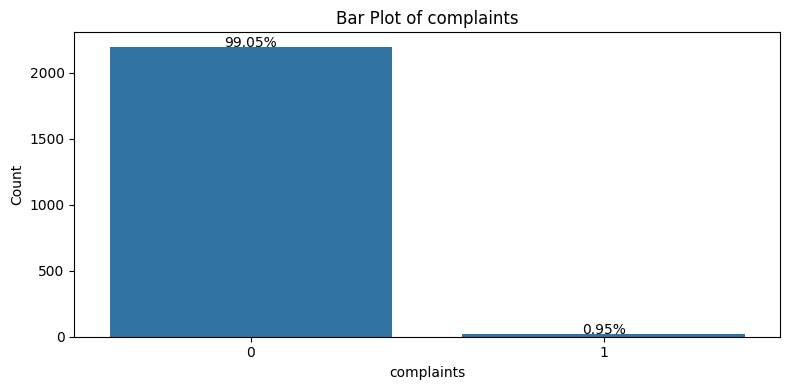

In [373]:
plot_categorical_feature(data_cleaned, 'complaints')

0.95% of customers complained in the last 2 years

### 4.5. Distribution of Data

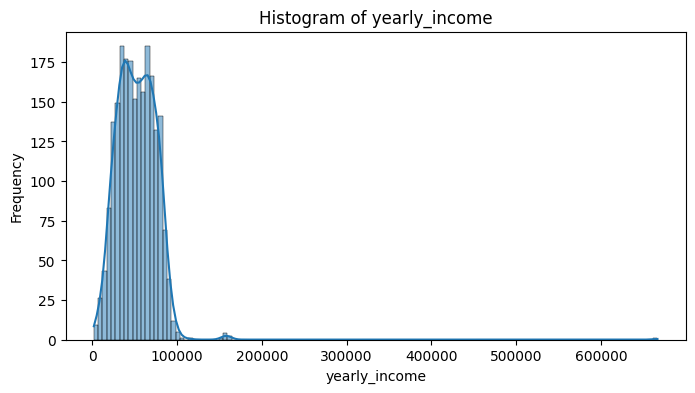

In [374]:
plt.figure(figsize=(8, 4))
sns.histplot(data_cleaned['yearly_income'], kde=True)
plt.title('Histogram of yearly_income')
plt.xlabel('yearly_income')
plt.ylabel('Frequency')
plt.show()

In [375]:
# Calculate skewness
skewness = data_cleaned['yearly_income'].skew()
print("Skewness of yearly_income:")
print(skewness)

Skewness of yearly_income:
6.7634873728111184


Positively skewed distribution

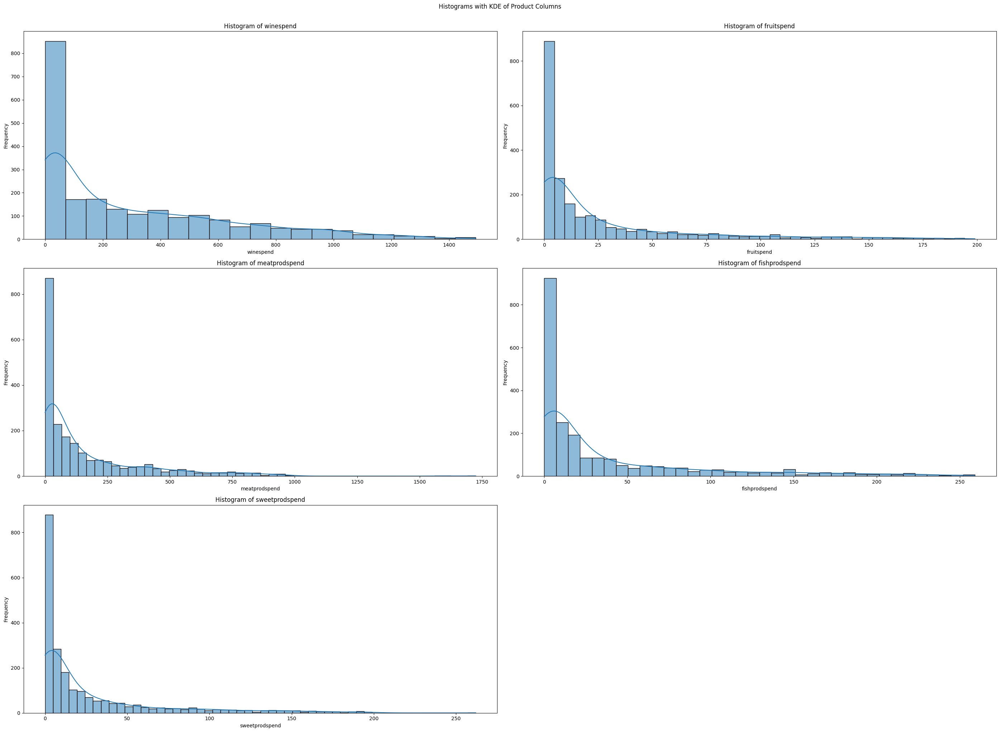

In [376]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(28, 20))
axes = axes.flatten()

for i, col in enumerate(product.columns):
    sns.histplot(data_cleaned[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# remove blank plot in a row
fig.delaxes(axes[-1])

# adjust the layout
plt.tight_layout()
plt.suptitle('Histograms with KDE of Product Columns', y=1.02)
plt.show()

- The columns; 'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend', 'sweetprodspend', 'premiumprodspend' have positively skewed distribution

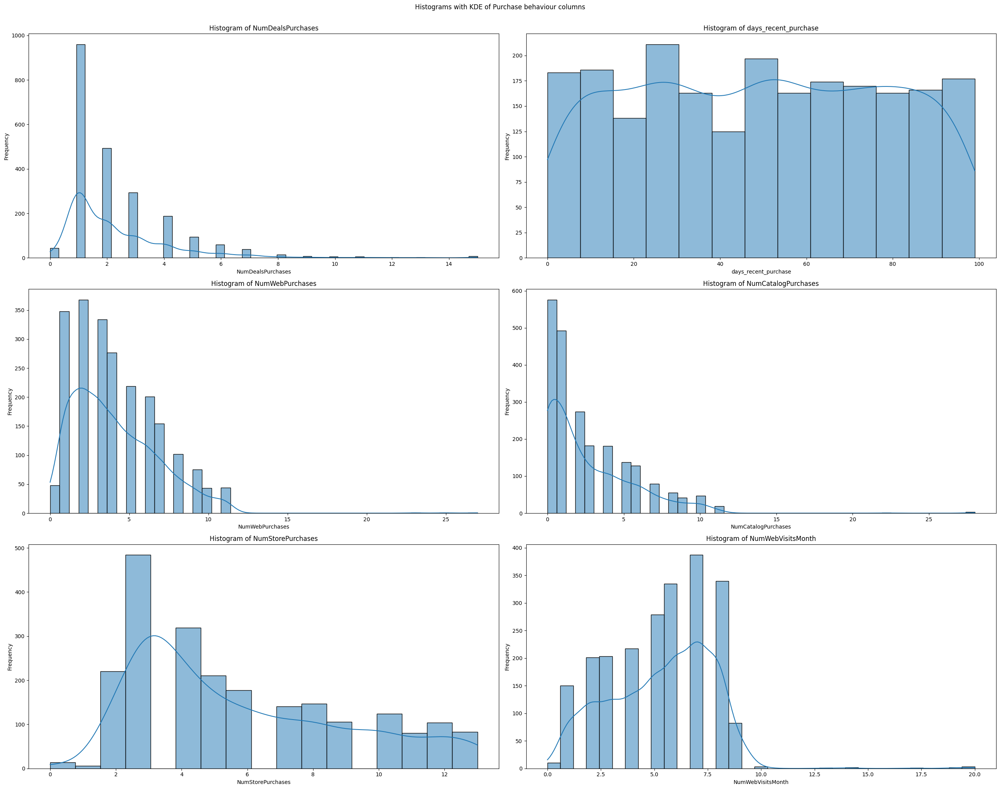

In [377]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(26, 20))
axes = axes.flatten()

for i, col in enumerate(purch_behaviour.columns):
    sns.histplot(data_cleaned[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# adjust the layout
plt.tight_layout()
plt.suptitle('Histograms with KDE of Purchase behaviour columns', y=1.02)
plt.show()

-   NumCatalogPurchases, NumStorePurchases, NumWebVisitsMonth columns have positively skewed distribution
- NumDealsPurchases - most customers are making 0 - 3 purchases through deals, positively skewed distribution
- Days_recent_purchase column has fairly uniform distribution, purchases are spread evenly over the time range
- NumWebPurchases - Right-skewed, with the majority making fewer than 10 web purchases.
- NumCatalogPurchases: Heavily right-skewed, with most customers making very few catalog purchases
- NumStorePurchases: Somewhat bimodal distribution, with peaks around 2 and 5 store purchases.
- NumWebVisitsMonth: Right-skewed, with most people visiting the website fewer than 8 times per month.

In [378]:
data_cleaned.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'yearly_income',
       'Kidhome', 'Teenhome', 'date_enrollment', 'days_recent_purchase',
       'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend',
       'sweetprodspend', 'premiumprodspend', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'complaints', 'Z_CostContact',
       'Z_Revenue', 'cmpresponse'],
      dtype='object')

### 4.5. Outliers

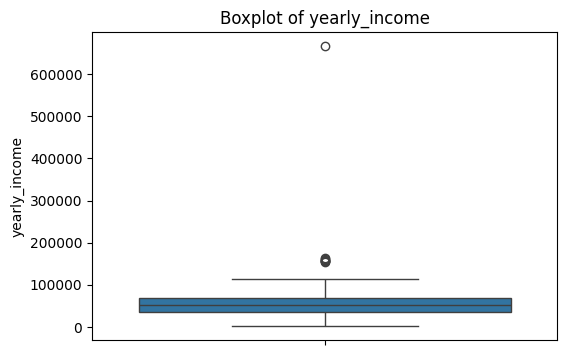

In [379]:
plt.figure(figsize=(6, 4))
sns.boxplot(y=data_cleaned['yearly_income'])
plt.title('Boxplot of yearly_income')
plt.ylabel('yearly_income')
plt.show()

Yearly income data has multiple outliers

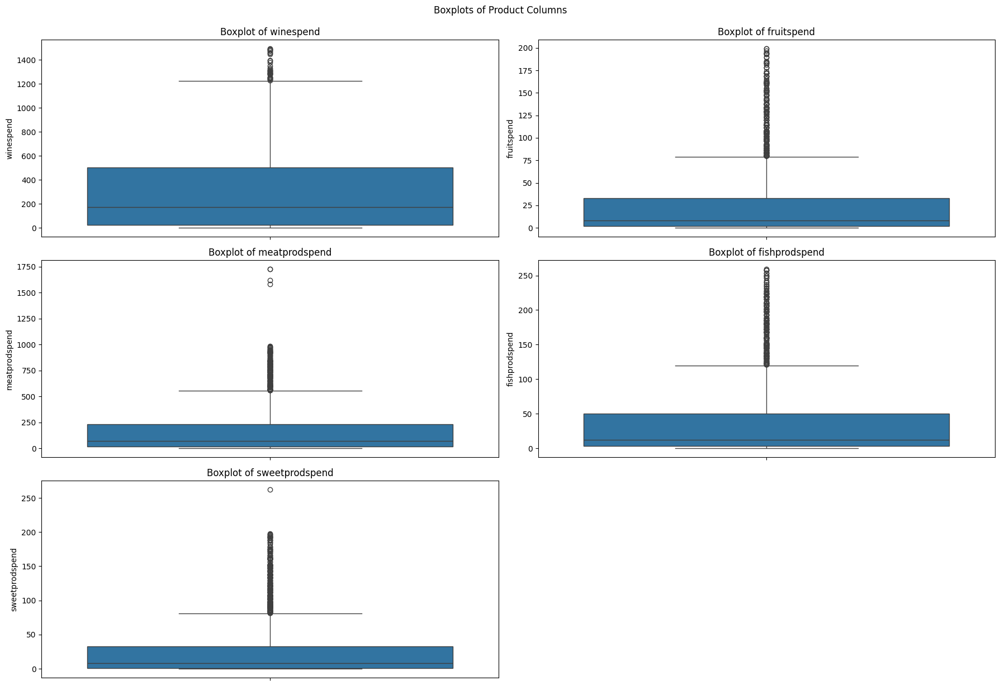

In [380]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 12))
axes = axes.flatten()

for i, col in enumerate(product.columns):
    sns.boxplot(y=data_cleaned[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_ylabel(col)

# remove blank plot in a row
fig.delaxes(axes[-1])

# adjust the layout
plt.tight_layout()
plt.suptitle('Boxplots of Product Columns', y=1.02)
plt.show()

The data on spend on wines, fruits, meatproducts, fishproducts, sweetproducts and premium products has outliers.

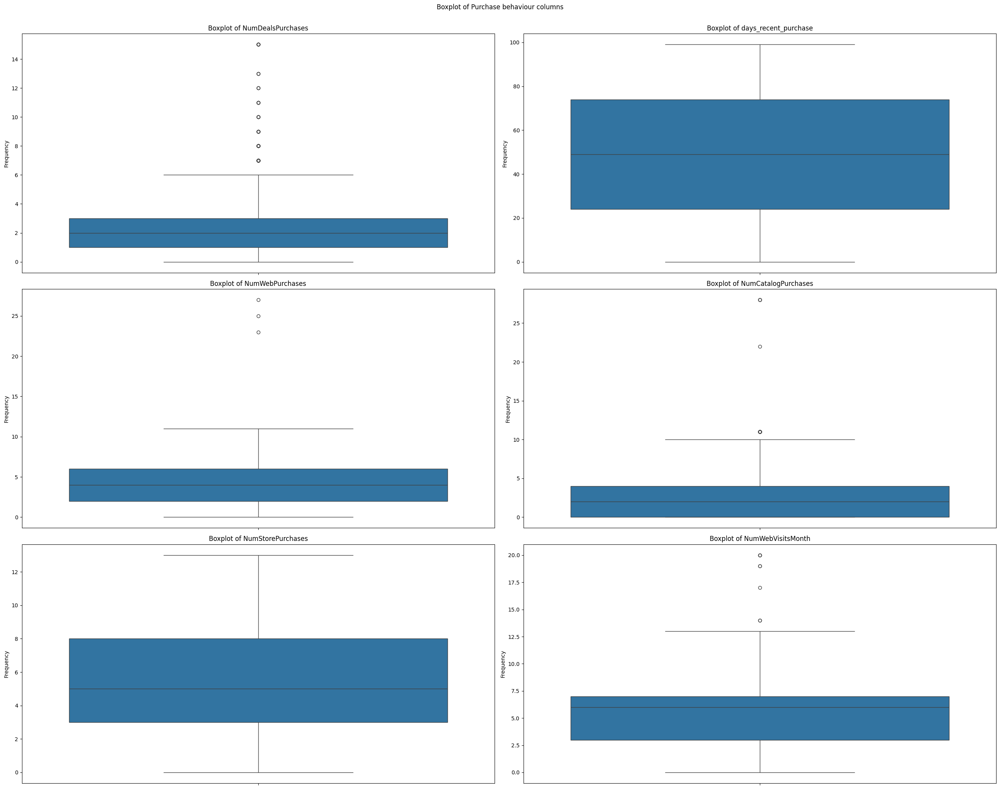

In [381]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(26, 20))
axes = axes.flatten()

for i, col in enumerate(purch_behaviour.columns):
    sns.boxplot(data_cleaned[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_ylabel('Frequency')

# adjust the layout
plt.tight_layout()
plt.suptitle('Boxplot of Purchase behaviour columns', y=1.02)
plt.show()

- The data on number of purchases through deals, web purchases, catalog purchases, web visits per month have multiple outliers
- The data on days since most recent purchases and number of store purchases have no outliers

In [382]:
data_cleaned.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'yearly_income',
       'Kidhome', 'Teenhome', 'date_enrollment', 'days_recent_purchase',
       'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend',
       'sweetprodspend', 'premiumprodspend', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'complaints', 'Z_CostContact',
       'Z_Revenue', 'cmpresponse'],
      dtype='object')

### 4.7. Multicollinearity

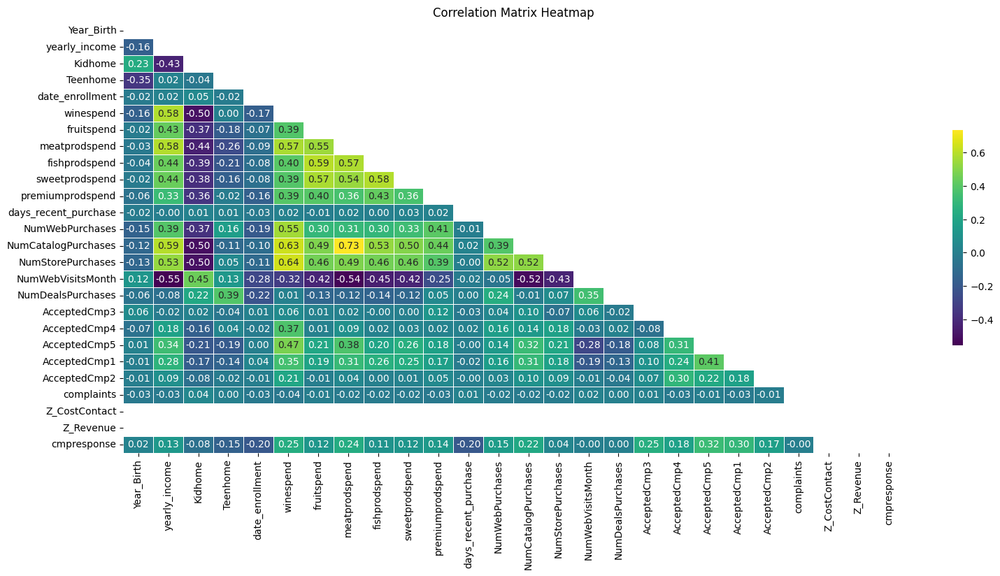

In [383]:
# Select the columns for correlation matrix
corr_cols = data_cleaned[['Year_Birth','yearly_income', 'Kidhome', 'Teenhome','date_enrollment',
                        'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend','sweetprodspend', 'premiumprodspend',
                        'days_recent_purchase', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'NumDealsPurchases',
                        'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5','AcceptedCmp1', 'AcceptedCmp2', 'complaints', 'Z_CostContact','Z_Revenue', 'cmpresponse']]

# Calculate the correlation matrix
correlation_matrix = corr_cols.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(correlation_matrix, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(18, 8))
sns.heatmap(correlation_matrix, annot=True, mask=mask, cmap='viridis', linewidths=0.5, fmt='.2f', cbar_kws={'shrink': 0.5})

plt.title('Correlation Matrix Heatmap')
plt.show()

In [384]:
# Find pairs of features with correlation greater than 0.5
high_corr_pairs = correlation_matrix.unstack().reset_index()
high_corr_pairs.columns = ['Feature1', 'Feature2', 'Correlation']
high_corr_pairs = high_corr_pairs[(high_corr_pairs['Correlation'] > 0.5) & (high_corr_pairs['Feature1'] != high_corr_pairs['Feature2'])]

# Remove duplicate pairs
high_corr_pairs['Pairs'] = high_corr_pairs.apply(lambda row: tuple(sorted([row['Feature1'], row['Feature2']])), axis=1)
high_corr_pairs = high_corr_pairs.drop_duplicates(subset='Pairs').drop(columns='Pairs')

high_corr_pairs_sorted = high_corr_pairs.sort_values(by='Correlation', ascending=False)
print(high_corr_pairs_sorted)

                Feature1             Feature2  Correlation
195        meatprodspend  NumCatalogPurchases     0.734127
144            winespend    NumStorePurchases     0.640012
143            winespend  NumCatalogPurchases     0.634753
164           fruitspend        fishprodspend     0.593431
39         yearly_income  NumCatalogPurchases     0.589162
33         yearly_income        meatprodspend     0.584633
217        fishprodspend       sweetprodspend     0.583867
31         yearly_income            winespend     0.578650
190        meatprodspend        fishprodspend     0.573574
165           fruitspend       sweetprodspend     0.571606
137            winespend        meatprodspend     0.568860
142            winespend      NumWebPurchases     0.553786
163           fruitspend        meatprodspend     0.547822
191        meatprodspend       sweetprodspend     0.535136
221        fishprodspend  NumCatalogPurchases     0.532757
40         yearly_income    NumStorePurchases     0.5293

The feature pairs above have strong to moderate correlation

### 4.8 Explore relationships between the different columns

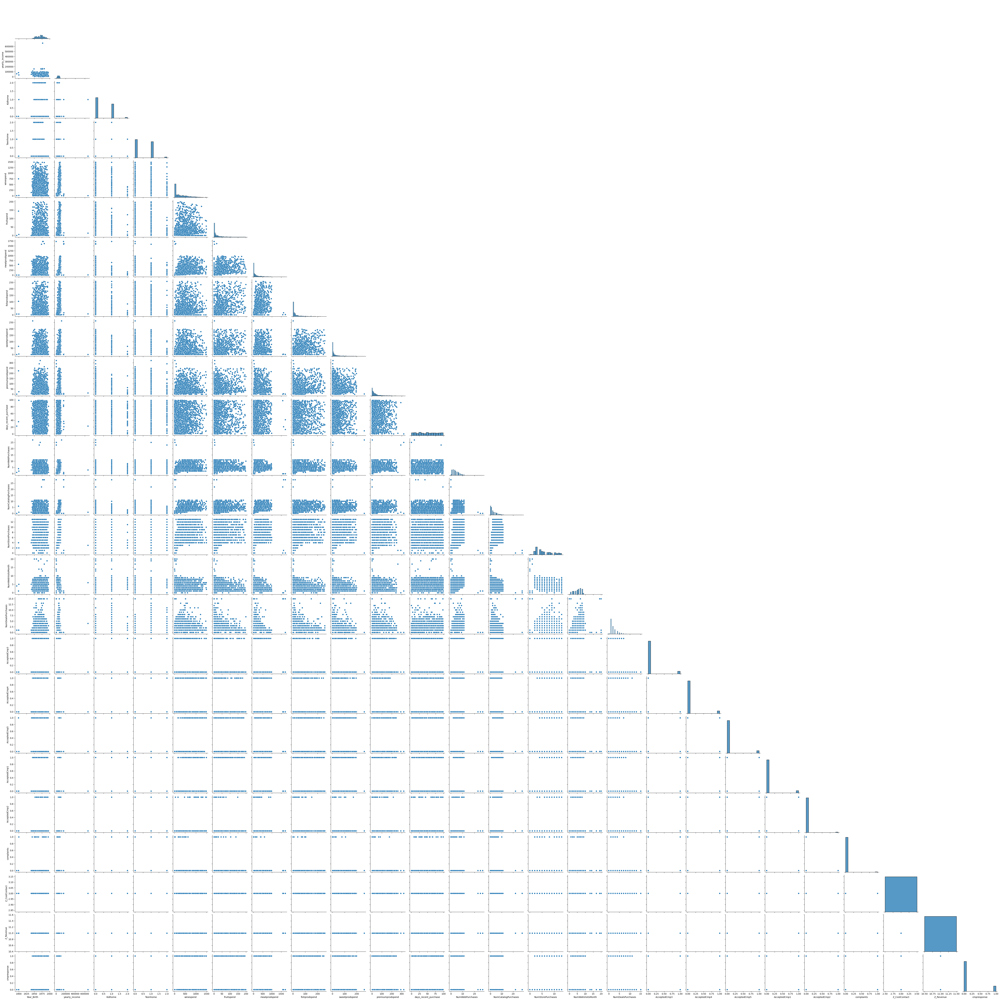

In [385]:
sns.pairplot(corr_cols, corner=True) # remove duplicate plots
plt.show()

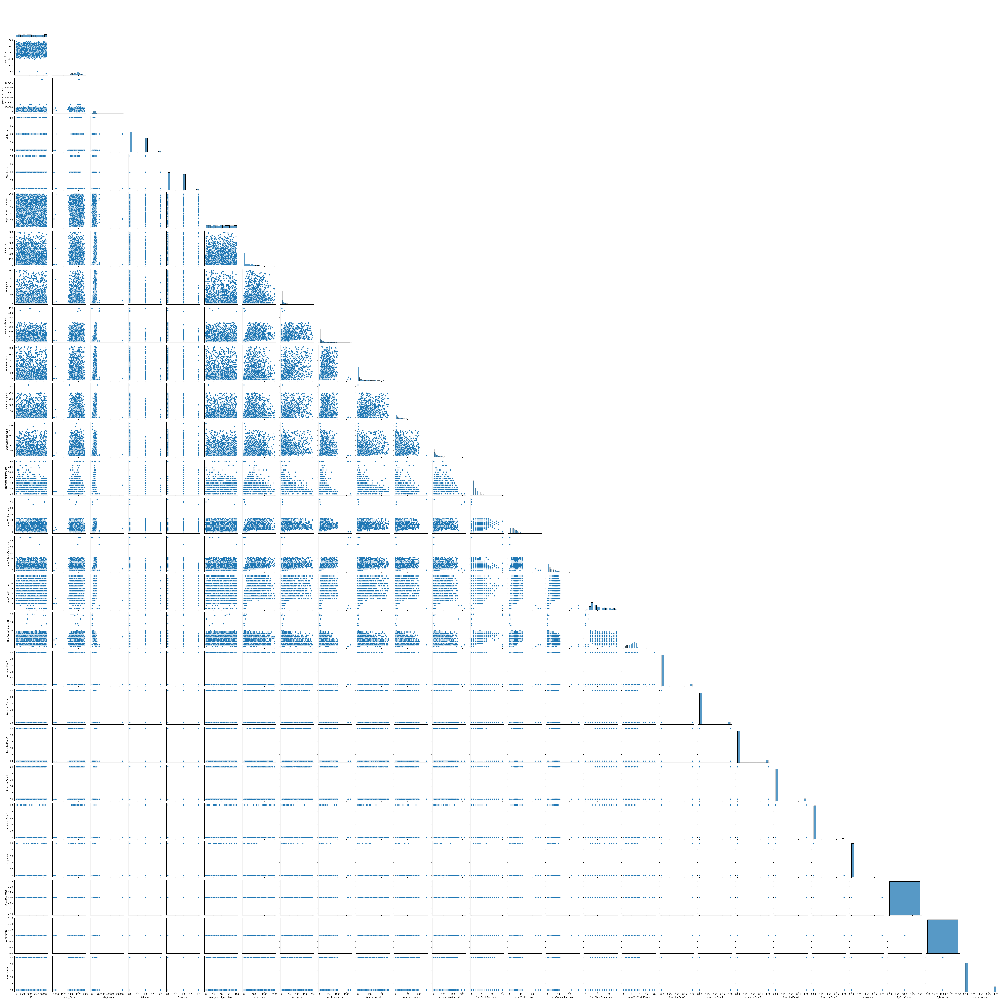

In [386]:
sns.pairplot(data_cleaned, corner=True)

## 5.0. Data preprocessing

### 5.1 Reducing number of categories for the categorical columns with sociodemographic data

In [387]:
pd.options.mode.copy_on_write = True # set Copy-on-Write (CoW) behavior, which helps improve performance and memory usage when working with DataFrames.

In [388]:
# Combine 'Absurd' and 'YOLO' categories in the 'Marital_Status' column
data_cleaned['Marital_Status'] = data_cleaned['Marital_Status'].replace(['Absurd', 'YOLO'], 'Other')

# Combine 'Alone' and 'Single' categories in the 'Marital_Status' column
data_cleaned['Marital_Status'] = data_cleaned['Marital_Status'].replace('Alone', 'Single')

# Combine 'Married' and 'Together' categories in the 'Marital_Status' column
data_cleaned['Marital_Status'] = data_cleaned['Marital_Status'].replace(['Married', 'Together'], 'Married')

# Verify the changes
data_cleaned['Marital_Status'].unique()

array(['Single', 'Married', 'Divorced', 'Widow', 'Other'], dtype=object)

In [389]:
#The education level 2n cycle is the same as master, therefore combine the data for 2n cycle and Master to Master category
# Combine '2n Cycle' and 'Master' categories in the 'Education' column
data_cleaned['Education'] = data_cleaned['Education'].replace('2n Cycle', 'Master')

# Verify the changes
data_cleaned['Education'].unique()

array(['Graduation', 'PhD', 'Master', 'Basic'], dtype=object)

In [390]:
data_prep = data_cleaned
data_prep.info(20)

<class 'pandas.core.frame.DataFrame'>
Index: 2216 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   ID                    2216 non-null   int64         
 1   Year_Birth            2216 non-null   int64         
 2   Education             2216 non-null   object        
 3   Marital_Status        2216 non-null   object        
 4   yearly_income         2216 non-null   float64       
 5   Kidhome               2216 non-null   int64         
 6   Teenhome              2216 non-null   int64         
 7   date_enrollment       2216 non-null   datetime64[ns]
 8   days_recent_purchase  2216 non-null   int64         
 9   winespend             2216 non-null   int64         
 10  fruitspend            2216 non-null   int64         
 11  meatprodspend         2216 non-null   int64         
 12  fishprodspend         2216 non-null   int64         
 13  sweetprodspend        2

### 5.2 Feature Extraction - Creating features from existing ones

#### 5.2.1 Creation of Total Spend Column

In [391]:
# calculate total spend per customer and create a new feature
data_prep['total_Spend'] = data_prep[['winespend', 'fruitspend', 'meatprodspend', 'fishprodspend','sweetprodspend', 'premiumprodspend']].sum(axis=1)

# Display the first few rows to confirm the new column
data_prep.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2216 entries, 0 to 2239
Data columns (total 30 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   ID                    2216 non-null   int64         
 1   Year_Birth            2216 non-null   int64         
 2   Education             2216 non-null   object        
 3   Marital_Status        2216 non-null   object        
 4   yearly_income         2216 non-null   float64       
 5   Kidhome               2216 non-null   int64         
 6   Teenhome              2216 non-null   int64         
 7   date_enrollment       2216 non-null   datetime64[ns]
 8   days_recent_purchase  2216 non-null   int64         
 9   winespend             2216 non-null   int64         
 10  fruitspend            2216 non-null   int64         
 11  meatprodspend         2216 non-null   int64         
 12  fishprodspend         2216 non-null   int64         
 13  sweetprodspend        2

#### 5.2.2 Creation of months_enrollment column

In [392]:
# calculation of months of enrollment from date of enrollment column for each customer
most_recent_enrollment_date = data_prep['date_enrollment'].max()

# Calculate the age from enrollment to the company based on the most recently joined customer
data_prep['time_from_enrollment'] = (most_recent_enrollment_date - data_prep['date_enrollment']).dt.days // 30

# Display the first few rows to confirm the new column
print(most_recent_enrollment_date)
data_prep.head()

2014-06-29 00:00:00


,ID,Year_Birth,Education,Marital_Status,yearly_income,Kidhome,Teenhome,date_enrollment,days_recent_purchase,winespend,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,complaints,Z_CostContact,Z_Revenue,cmpresponse,total_Spend,time_from_enrollment
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,0,3,11,1,1617,22
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,0,3,11,0,27,3
2,4141,1965,Graduation,Married,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,0,3,11,0,776,10
3,6182,1984,Graduation,Married,26646.0,1,0,2014-02-10,26,11,...,0,0,0,0,0,3,11,0,53,4
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,0,0,0,0,0,3,11,0,422,5


#### 5.2.3 Creation of column HasTeenandChild'

In [393]:
# Create a feature that is 1 if has teen and child and 0 if neither

# Create the 'HasTeenAndChild' feature
data_prep['HasTeenandKid'] = 0  # Initialize the column with 0s
data_prep.loc[(data_prep['Kidhome'] > 0) & (data_prep['Teenhome'] > 0), 'HasTeenandKid'] = 1

# Display the first few rows to confirm the new column
print(data_prep[['Kidhome', 'Teenhome', 'HasTeenandKid']].head())

   Kidhome  Teenhome  HasTeenandKid
0        0         0              0
1        1         1              1
2        0         0              0
3        1         0              0
4        1         0              0


#### 5.2.4 Creation of age column

In [394]:
# Creation of age column from the Year_Birth column
current_year = 2014 # 2014 chosen based on the most recent date in the dataset being 2014-06-29 00:00:00

# Create the 'Age' column
data_prep['age'] = current_year - data_prep['Year_Birth']

data_prep.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2216 entries, 0 to 2239
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   ID                    2216 non-null   int64         
 1   Year_Birth            2216 non-null   int64         
 2   Education             2216 non-null   object        
 3   Marital_Status        2216 non-null   object        
 4   yearly_income         2216 non-null   float64       
 5   Kidhome               2216 non-null   int64         
 6   Teenhome              2216 non-null   int64         
 7   date_enrollment       2216 non-null   datetime64[ns]
 8   days_recent_purchase  2216 non-null   int64         
 9   winespend             2216 non-null   int64         
 10  fruitspend            2216 non-null   int64         
 11  meatprodspend         2216 non-null   int64         
 12  fishprodspend         2216 non-null   int64         
 13  sweetprodspend        2

### 5.3 Deletion of unneccesary features

In [395]:
# Delete features not required for modelling
updated_data = data_prep.drop(['date_enrollment', 'ID', 'Year_Birth','Z_CostContact','Z_Revenue'], axis=1)

updated_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2216 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Education             2216 non-null   object 
 1   Marital_Status        2216 non-null   object 
 2   yearly_income         2216 non-null   float64
 3   Kidhome               2216 non-null   int64  
 4   Teenhome              2216 non-null   int64  
 5   days_recent_purchase  2216 non-null   int64  
 6   winespend             2216 non-null   int64  
 7   fruitspend            2216 non-null   int64  
 8   meatprodspend         2216 non-null   int64  
 9   fishprodspend         2216 non-null   int64  
 10  sweetprodspend        2216 non-null   int64  
 11  premiumprodspend      2216 non-null   int64  
 12  NumDealsPurchases     2216 non-null   int64  
 13  NumWebPurchases       2216 non-null   int64  
 14  NumCatalogPurchases   2216 non-null   int64  
 15  NumStorePurchases     2216

#### 5.4 EDA of new features

Conduct further EDA of the created new features and the 2 transformed/mutated categorical features; Marital Status & Education

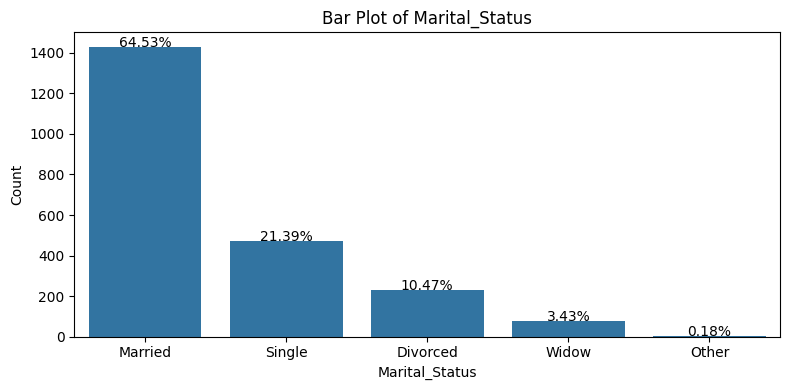

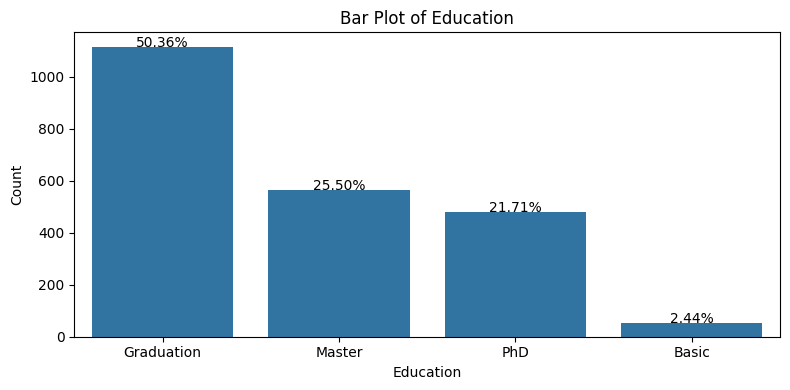

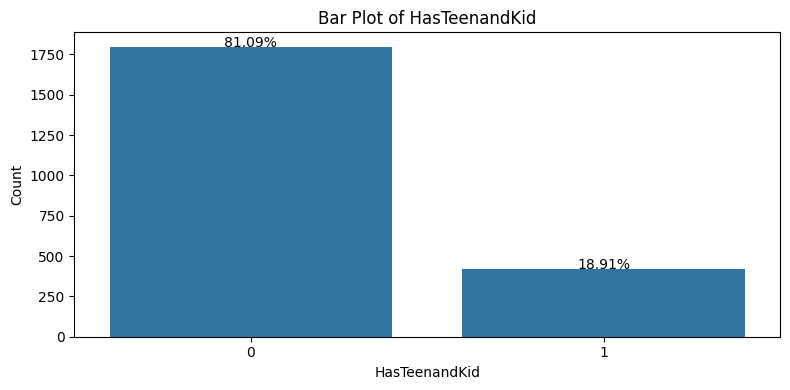

In [396]:
# plot bar plot of categorical features created:
plot_categorical_feature(updated_data, 'Marital_Status')
plot_categorical_feature(updated_data, 'Education')
plot_categorical_feature(updated_data, 'HasTeenandKid')

- Majority of the customers are married (64.53%)
- Most common education level is graduation (50.36%)
- Most customers have children , either kids or teenagers (71.44%)
- Most customers have one child (50.41%), with the least customers having 3 children (2.26%)
- Few customers have a kid and teenager (18.91%), with most having either a kid or a teen(81.09%)

In [397]:
# Frequency tables of created categorical features
marital_status_2_freq_table = create_frequency_table(updated_data,'Marital_Status')
education_freq_table = create_frequency_table(updated_data,'Education')
hasteenandkid_freq_table = create_frequency_table(updated_data, 'HasTeenandKid')

print(education_freq_table)

print(marital_status_2_freq_table)

print(hasteenandkid_freq_table)

    Education  Count  Percentage
0  Graduation   1116   50.361011
1      Master    565   25.496390
2         PhD    481   21.705776
3       Basic     54    2.436823
  Marital_Status  Count  Percentage
0        Married   1430   64.530686
1         Single    474   21.389892
2       Divorced    232   10.469314
3          Widow     76    3.429603
4          Other      4    0.180505
   HasTeenandKid  Count  Percentage
0              0   1797   81.092058
1              1    419   18.907942


In [398]:
# get summary statistics of Total spend Column, date_enrollment', age
updated_data[['total_Spend','time_from_enrollment', 'age']].describe()

,total_Spend,time_from_enrollment,age
count,2216.000000,2216.000000,2216.000000
mean,607.075361,11.313177,45.179603
std,602.900476,6.738611,11.985554
min,5.000000,0.000000,18.000000
25%,69.000000,6.000000,37.000000
50%,396.500000,11.000000,44.000000
75%,1048.000000,17.000000,55.000000
max,2525.000000,23.000000,121.000000


- The average total spend per customer is 607.1, lowest total spend per customer is 5, while highest total spend per customer is 2525
- Customers who have been enrolled for the longest are 23 months with the shortest being 0 months, the mean nrollment period is 11.3 months.
- The oldest customer is 121 years, while the youngest customer is 18 years. mean age of the customers is 45 years.

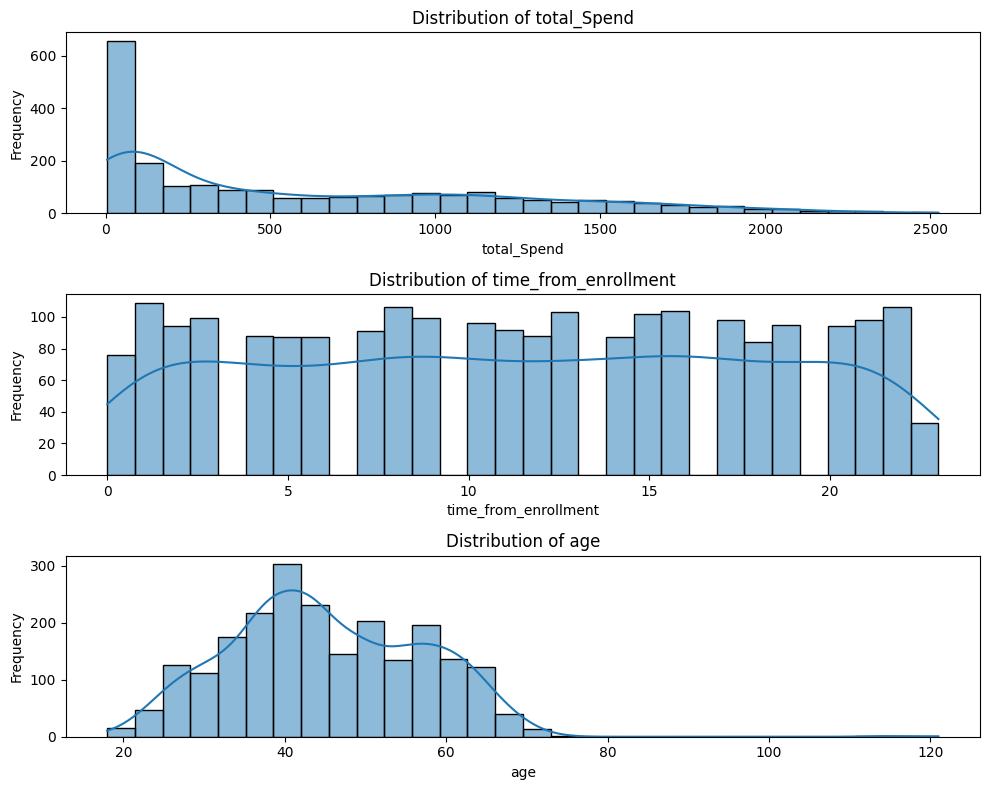

In [399]:
cols = updated_data[['total_Spend','time_from_enrollment', 'age']]

plt.figure(figsize=(10, 8))
for i, column in enumerate(cols.columns):
	plt.subplot(3, 1, i + 1)
	sns.histplot(updated_data[column], bins=30, kde=True)
	plt.title(f'Distribution of {column}')
	plt.xlabel(column)
	plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

1. Total Spend
  - Positively skewed distribution
  - Most customers have low spend
2. time_from_enrollment
  - Multimodal distribution
  - Enrollment of customers into the company seems to be uniformly spread over the months
3. Age of customers
  - Approximately normal distribution with some slight right skew
  - Mode of age is around 40 years
  - Majority of data is concentreated between 20 and 70 years

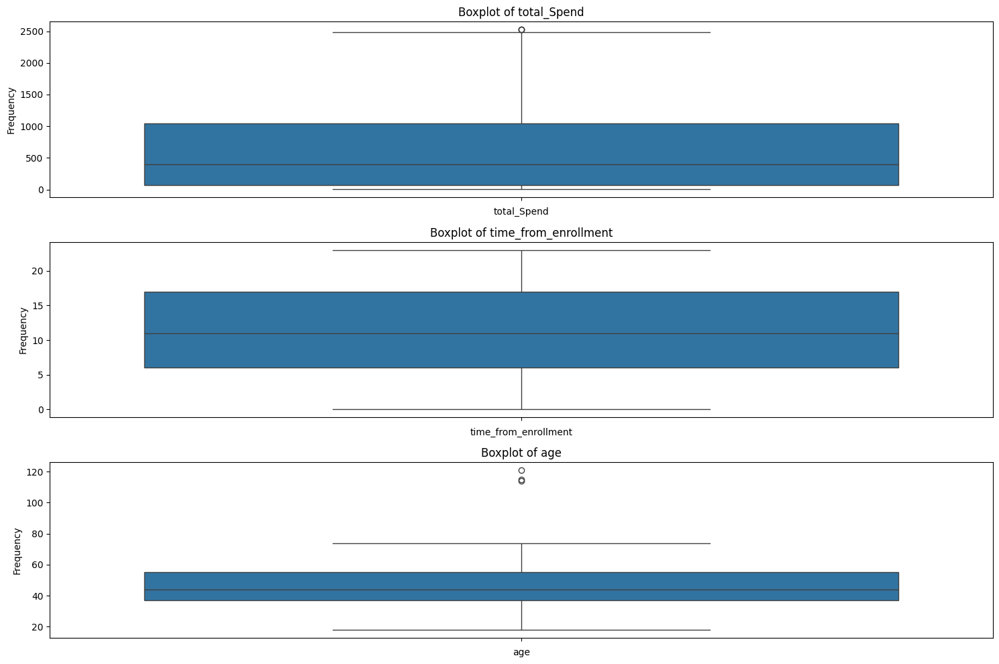

In [400]:
# Check for outliers in the newly created numeric features
cols = updated_data[['total_Spend','time_from_enrollment', 'age']]

plt.figure(figsize=(15, 10))
for i, column in enumerate(cols.columns):
	plt.subplot(3, 1, i + 1)
	sns.boxplot(updated_data[column])
	plt.title(f'Boxplot of {column}')
	plt.xlabel(column)
	plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

1. Total_spend column has an outlier
   - Median spend is less than 500
2. time_from_enrollment
   - no outliers
   - media time from enrollment of a customer is around 10 months
3. Age
   - Age feature has multiple outliers
   - The outliers could be due to wrong data entry

In [401]:
# Calculate skewness of the numeric features
skewness = updated_data[['total_Spend','time_from_enrollment', 'age']].skew()
print("Skewness of cols:")
print(skewness)

Skewness of cols:
total_Spend             0.858055
time_from_enrollment   -0.010805
age                     0.353661
dtype: float64


- Total_Spend: highly skewed
- time_from_enrollment - now skew
- age - slightly skewed

### 5.4 Encoding of categorical features with labeled categories

In [592]:
# One-hot encoding of 'Education' and 'Marital_Status' columns
data_encoded = pd.get_dummies(updated_data, columns=['Education', 'Marital_Status'])

# Display the first few rows of the encoded dataframe
data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2216 entries, 0 to 2239
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   yearly_income            2216 non-null   float64
 1   Kidhome                  2216 non-null   int64  
 2   Teenhome                 2216 non-null   int64  
 3   days_recent_purchase     2216 non-null   int64  
 4   winespend                2216 non-null   int64  
 5   fruitspend               2216 non-null   int64  
 6   meatprodspend            2216 non-null   int64  
 7   fishprodspend            2216 non-null   int64  
 8   sweetprodspend           2216 non-null   int64  
 9   premiumprodspend         2216 non-null   int64  
 10  NumDealsPurchases        2216 non-null   int64  
 11  NumWebPurchases          2216 non-null   int64  
 12  NumCatalogPurchases      2216 non-null   int64  
 13  NumStorePurchases        2216 non-null   int64  
 14  NumWebVisitsMonth        2216

Total number of features for final model = 35

### 5.5 Check for multicollinearity of updated features

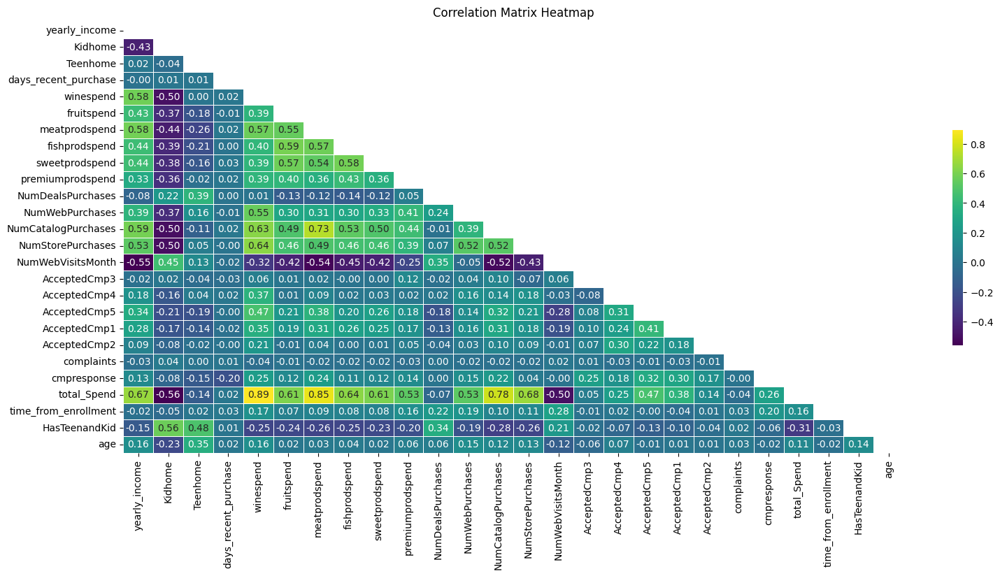

In [593]:
# Select numerical columns and create a correlation matrix
# Select numerical columns
numerical_cols = data_encoded.select_dtypes(include=np.number)

# Calculate the correlation matrix
correlation_matrix = numerical_cols.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(correlation_matrix, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(18, 8))
sns.heatmap(correlation_matrix, annot=True, mask=mask, cmap='viridis', linewidths=0.5, fmt='.2f', cbar_kws={'shrink': 0.5})
plt.title('Correlation Matrix Heatmap')
plt.show()

In [594]:
# Find pairs of features with correlation greater than 0.5
high_corr_pairs = correlation_matrix.unstack().reset_index()
high_corr_pairs.columns = ['Feature1', 'Feature2', 'Correlation']
high_corr_pairs = high_corr_pairs[(high_corr_pairs['Correlation'] > 0.5) & (high_corr_pairs['Feature1'] != high_corr_pairs['Feature2'])]

# Remove duplicate pairs
high_corr_pairs['Pairs'] = high_corr_pairs.apply(lambda row: tuple(sorted([row['Feature1'], row['Feature2']])), axis=1)
high_corr_pairs = high_corr_pairs.drop_duplicates(subset='Pairs').drop(columns='Pairs')

high_corr_pairs_sorted = high_corr_pairs.sort_values(by='Correlation', ascending=False)
high_corr_pairs_sorted

,Feature1,Feature2,Correlation
126,winespend,total_Spend,0.893136
178,meatprodspend,total_Spend,0.845884
334,NumCatalogPurchases,total_Spend,0.780482
168,meatprodspend,NumCatalogPurchases,0.734127
360,NumStorePurchases,total_Spend,0.675181
22,yearly_income,total_Spend,0.667576
204,fishprodspend,total_Spend,0.642371
117,winespend,NumStorePurchases,0.640012
116,winespend,NumCatalogPurchases,0.634753
152,fruitspend,total_Spend,0.613249


**Strong Positive Correlations:**
- total_Spend and winespend has high positive correlation (0.89) - customers who spend more overall also tend to spend more on wines
- total_Spend and meatprodspend has high positive correlation (0.85) - customers who spend more overall also tend to spend more on meat products
- NumCatalogPurchases	and total_Spend	(0.78) - customers who purchase more via the catalog correlates with a high total spend
- meatprodspend	NumCatalogPurchases	(0.73)- customers who purchase meat products tend to purchase via the catalog
- NumStorePurchases	total_Spend	(0.68) - customers who tend to do store purchases tend to have a higher total spend

In [595]:
# Find pairs of features with correlation less than 0
low_corr_pairs = correlation_matrix.unstack().reset_index()
low_corr_pairs.columns = ['Feature1', 'Feature2', 'Correlation']
low_corr_pairs = low_corr_pairs[(low_corr_pairs['Correlation'] < 0) & (low_corr_pairs['Feature1'] != low_corr_pairs['Feature2'])]

# Remove duplicate pairs
low_corr_pairs['Pairs'] = low_corr_pairs.apply(lambda row: tuple(sorted([row['Feature1'], row['Feature2']])), axis=1)
low_corr_pairs = low_corr_pairs.drop_duplicates(subset='Pairs').drop(columns='Pairs')

low_corr_pairs_sorted = low_corr_pairs.sort_values(by='Correlation', ascending=True)
low_corr_pairs_sorted

,Feature1,Feature2,Correlation
48,Kidhome,total_Spend,-0.557899
14,yearly_income,NumWebVisitsMonth,-0.553088
170,meatprodspend,NumWebVisitsMonth,-0.539484
326,NumCatalogPurchases,NumWebVisitsMonth,-0.522004
38,Kidhome,NumCatalogPurchases,-0.504501
...,...,...,...
541,complaints,cmpresponse,-0.002029
97,days_recent_purchase,AcceptedCmp2,-0.001400
95,days_recent_purchase,AcceptedCmp5,-0.000482
91,days_recent_purchase,NumStorePurchases,-0.000434


**Moderate Negative Correlations:**
  - Kidhome	and total_Spend	(-0.56): Customers with only kids does not correlate with high total spend
  - yearly_income	and NumWebVisitsMonth	(-0.55): Yearly income doesn't correlate with number of web visits per month
  - meatprodspend	and NumWebVisitsMonth	(-0.54): Amount spent on meat products does not correlate with number of web visits per month.
  - NumCatalogPurchases	and NumWebVisitsMonth	(-0.52): Number of catalog purchases made does not correlate with number of web visits per month.
  - Kidhome	and NumCatalogPurchases	(-0.50): Customers with only kids do not correlate with number of catalog purchases made.

### 5.6 Handling of Skewness

In [596]:
# Apply box-cox transformation to columns that are skewed

# Define columns to transform
columns_to_transform = ['yearly_income', 'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend', 'sweetprodspend',
                        'premiumprodspend','NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases', 'NumWebVisitsMonth',
                        'total_Spend'
]

# Ensure all values are positive by shifting data if needed
for col in columns_to_transform:
    if (data_encoded[col] <= 0).any():
        data_encoded[col] = data_encoded[col] + 1 - data_encoded[col].min()

# Apply Box-Cox transformation
for col in columns_to_transform:
    data_encoded[col], _ = stats.boxcox(data_encoded[col])

# Check the transformed data
data_encoded[columns_to_transform].head()

,yearly_income,winespend,fruitspend,meatprodspend,fishprodspend,sweetprodspend,premiumprodspend,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,total_Spend
0,343.857294,12.705329,4.199126,7.000696,5.412924,4.186754,5.888203,1.004241,2.775587,2.133795,5.779541,15.471636
1,309.398880,3.178017,0.685979,2.009098,1.110111,0.685661,2.182842,0.848214,0.744814,0.669832,4.259654,4.501993
2,378.892010,11.392982,3.690869,5.257759,4.935563,2.945816,4.714454,0.587106,2.775587,1.040811,3.473617,12.865355
3,239.014643,3.178017,1.571145,3.201087,2.453130,1.356564,1.991404,0.848214,1.232167,0.000000,5.027298,5.801453
4,344.283806,8.776828,3.576993,5.172430,3.993870,3.163852,3.269942,1.189755,2.165126,1.295112,4.259654,10.950039


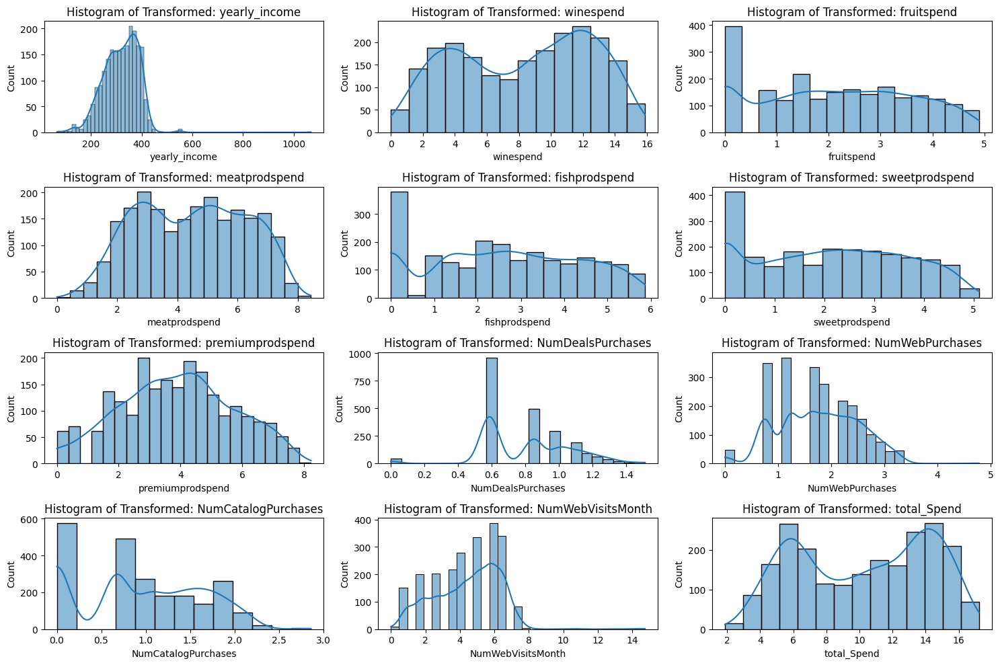

In [597]:
# Plot histograms of transformed columns to check distributions
plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_transform, 1):
    plt.subplot(4, 3, i)
    sns.histplot(data_encoded[col], kde=True)
    plt.title(f'Histogram of Transformed: {col}')
plt.tight_layout()
plt.show()

* 3 features still have skew: yearly income, NumWebPurchases and NumWebVisitsMonth


### 5.7 Outlier Handling

In [598]:
# Use robust scaling to handle features with outliers

# Define columns with outliers to scale
columns_to_scale = ['yearly_income', 'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend','sweetprodspend', 'premiumprodspend',
                    'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumWebVisitsMonth', 'total_Spend', 'age']

# Initialize RobustScaler
scaler = RobustScaler()

# Apply Robust Scaling to the specified columns
data_encoded[columns_to_scale] = scaler.fit_transform(data_encoded[columns_to_scale])

# Check the scaled data
data_encoded[columns_to_scale].head()

,yearly_income,winespend,fruitspend,meatprodspend,fishprodspend,sweetprodspend,premiumprodspend,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,total_Spend,age
0,0.194863,0.520932,0.915047,0.820087,1.040176,0.777970,0.777509,0.374044,0.749599,0.734818,0.241516,0.624448,0.722222
1,-0.154434,-0.749843,-0.635805,-0.844127,-0.567060,-0.541936,-0.693808,0.000000,-1.002445,-0.249411,-0.246461,-0.831144,0.888889
2,0.550002,0.345888,0.690681,0.238986,0.861867,0.310139,0.311439,-0.625956,0.749599,0.000000,-0.498828,0.278614,0.277778
3,-0.867902,-0.749843,-0.245055,-0.446714,-0.065400,-0.289007,-0.769825,0.000000,-0.581983,-0.699742,0.000000,-0.658715,-0.777778
4,0.199186,-0.003061,0.640411,0.210537,0.510115,0.392338,-0.262145,0.818780,0.222925,0.170968,-0.246461,0.024465,-0.611111


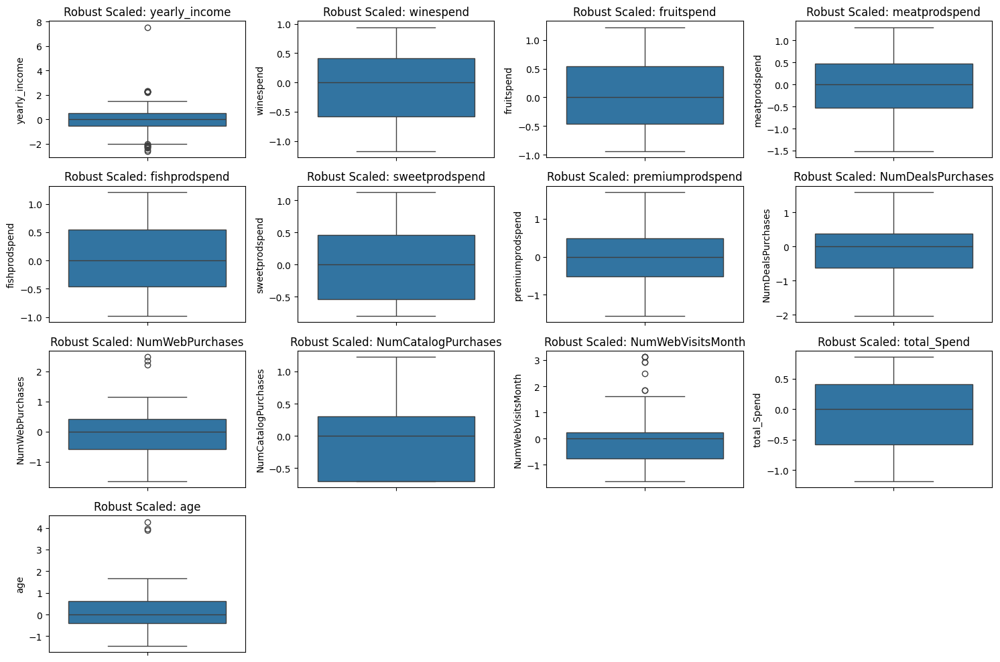

In [599]:
# plot boxplots of data that has been robust scaled

plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_scale, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(data_encoded[col])  # Create boxplot of the scaled data
    plt.title(f'Robust Scaled: {col}')
plt.tight_layout()
plt.show()

- 4 features still have outliers; yearly income, NumWebPurchases, NumWebVisitsMonth and Age
- The outliers will be handled using winsorization instead of removing the data points that are outliers.

In [600]:
# Use winsorization to handle outliers
for col in ['yearly_income','NumWebPurchases', 'NumWebVisitsMonth', 'age']:
    data_encoded[col] = winsorize(data_encoded[col], limits=[0.05, 0.05])

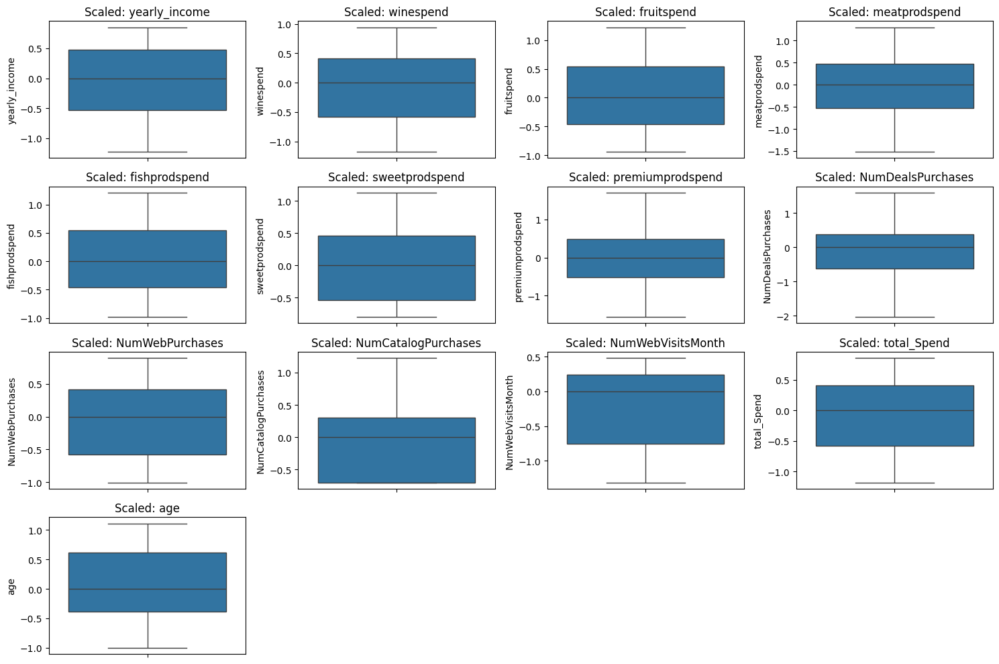

In [601]:
# plot boxplots of data that has been winsorized

plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_scale, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(data_encoded[col])  # Create boxplot of the scaled data
    plt.title(f'Scaled: {col}')
plt.tight_layout()
plt.show()

The features have no outliers

### 5.8 Normalization of Data

In [603]:
# use MinMax Scaler to normalize data that is normally distributed
# Define columns to normalize
columns_to_scale = ['yearly_income', 'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend','sweetprodspend', 'premiumprodspend',
                   'NumDealsPurchases', 'NumStorePurchases','NumWebPurchases', 'NumCatalogPurchases', 'NumWebVisitsMonth',
                   'total_Spend', 'age', 'days_recent_purchase', 'time_from_enrollment']

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Apply MinMax Scaling to the specified columns
data_encoded[columns_to_scale] = scaler.fit_transform(data_encoded[columns_to_scale].values)

# Verify the scaling
data_encoded[columns_to_scale].describe()

,yearly_income,winespend,fruitspend,meatprodspend,fishprodspend,sweetprodspend,premiumprodspend,NumDealsPurchases,NumStorePurchases,NumWebPurchases,NumCatalogPurchases,NumWebVisitsMonth,total_Spend,age,days_recent_purchase,time_from_enrollment
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,0.563265,0.520945,0.435830,0.529277,0.448119,0.416177,0.474158,0.533292,0.446230,0.469015,0.326033,0.619851,0.545366,0.502007,0.495077,0.491877
std,0.297238,0.264721,0.299324,0.211491,0.296399,0.290083,0.222009,0.175727,0.250060,0.318167,0.243125,0.315820,0.259065,0.295480,0.292408,0.292983
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.335318,0.279812,0.220631,0.351738,0.239545,0.134126,0.321009,0.388509,0.230769,0.221737,0.000000,0.308300,0.292061,0.289474,0.242424,0.260870
50%,0.590057,0.554227,0.434099,0.538061,0.448212,0.415326,0.478039,0.561293,0.384615,0.528655,0.363642,0.732331,0.579198,0.473684,0.494949,0.478261
75%,0.817731,0.752003,0.683115,0.707136,0.696102,0.653005,0.627333,0.664541,0.615385,0.749102,0.519681,0.867351,0.782598,0.763158,0.747475,0.739130
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


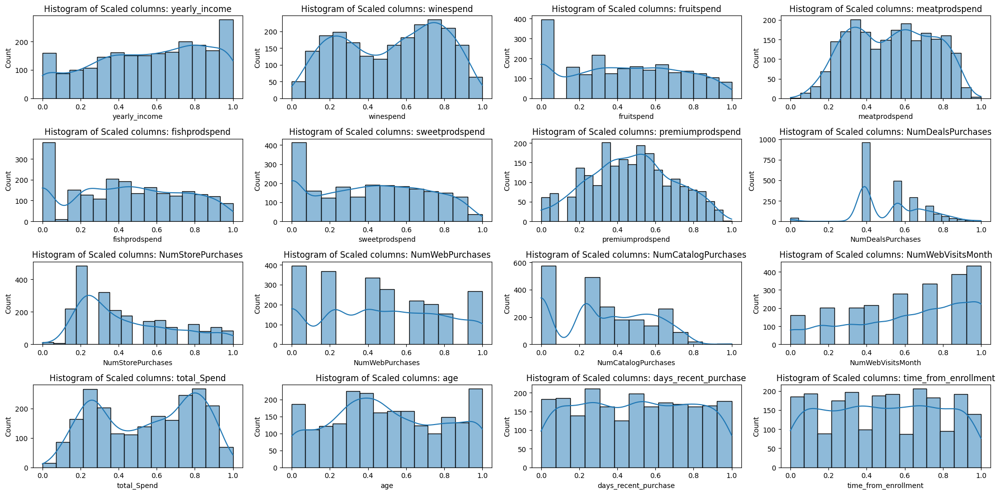

In [604]:
# Plot histograms of normalised featurs to check distributions
plt.figure(figsize=(20, 10))
for i, col in enumerate(columns_to_scale, 1):
    plt.subplot(4, 4, i)
    sns.histplot(data_encoded[col], kde=True)
    plt.title(f'Histogram of Scaled columns: {col}')
plt.tight_layout()
plt.show()

Some features are still not normalised, they include: yearly_income, fruitspend, fishprodspend, sweetprodspend, NumWebPurchases, NumCatalogPurchases, NumWebVisitsMonth, days_recent_purchase, time_from_enrollment

In [605]:
# Standardise numerical cols
# Replace 'numerical_cols' with the actual numerical columns you want to standardize.
numerical_cols = ['yearly_income', 'days_recent_purchase',
       'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend',
       'sweetprodspend', 'premiumprodspend', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'total_Spend', 'time_from_enrollment', 'age',]

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the numerical columns
data_encoded[numerical_cols] = scaler.fit_transform(data_encoded[numerical_cols])

# Verify the transformation
print(data_encoded[numerical_cols].head())

   yearly_income  days_recent_purchase  winespend  fruitspend  meatprodspend  \
0       0.406488              0.310532   1.055165    1.408371       1.419961   
1      -0.160544             -0.380509  -1.212065   -0.988384      -1.377286   
2       0.983003             -0.795134   0.742863    1.061626       0.443235   
3      -1.318755             -0.795134  -1.212065   -0.384502      -0.709306   
4       0.413507              1.554407   0.120293    0.983937       0.395417   

   fishprodspend  sweetprodspend  premiumprodspend  NumDealsPurchases  \
0       1.602909        1.388951          1.090522           0.747062   
1      -0.873352       -0.972529         -0.940035           0.159380   
2       1.328188        0.551941          0.447302          -0.824092   
3      -0.100447       -0.520007         -1.044944           0.159380   
4       0.786245        0.699005         -0.344298           1.445810   

   NumWebPurchases  NumCatalogPurchases  NumStorePurchases  NumWebVisitsMonth  \

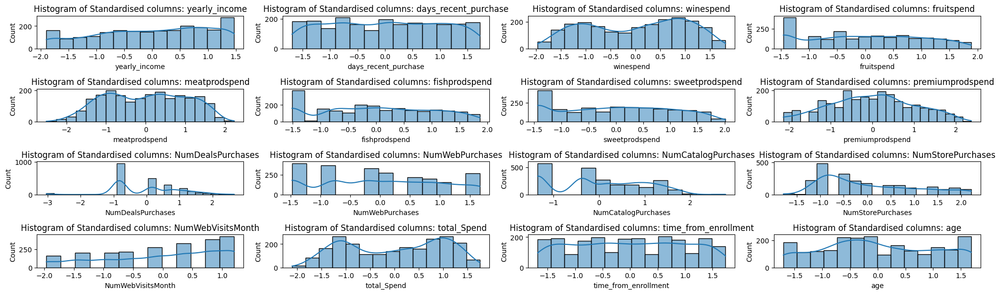

In [606]:
# plot a histogram with KDE
plt.figure(figsize=(20, 10))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(7, 4, i)
    sns.histplot(data_encoded[col], kde=True)
    plt.title(f'Histogram of Standardised columns: {col}')
plt.tight_layout()
plt.show()

In [590]:
data_encoded.head()

,yearly_income,Kidhome,Teenhome,days_recent_purchase,winespend,fruitspend,meatprodspend,fishprodspend,sweetprodspend,premiumprodspend,...,age,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Other,Marital_Status_Single,Marital_Status_Widow
0,0.384559,-0.823039,-0.928972,0.310532,1.053569,1.349439,1.394122,1.535058,1.329863,1.086925,...,1.062182,False,True,False,False,False,False,False,True,False
1,-0.195413,1.039938,0.909066,-0.380509,-1.213021,-0.974058,-1.397753,-0.851204,-0.955436,-0.936432,...,1.329426,False,True,False,False,False,False,False,True,False
2,0.992721,-0.823039,-0.928972,-0.795134,0.744081,1.046431,0.460602,1.290192,0.587283,0.453897,...,0.349532,False,True,False,False,False,True,False,False,False
3,-1.309544,1.039938,-0.928972,-0.795134,-1.213021,-0.324905,-0.693221,-0.053747,-0.462215,-1.043355,...,-1.343013,False,True,False,False,False,True,False,False,False
4,0.391856,1.039938,-0.928972,1.554407,0.124908,0.977417,0.413973,0.795694,0.721782,-0.334525,...,-1.075770,False,False,False,True,False,True,False,False,False


In [610]:
# save the dataframe to use for clustering analysis as a csv file.
data_encoded.to_csv('final_customer_data.csv', index=False)

In [611]:
# Load the data from the fina_customer_data csv file for clustering analysis.
data = pd.read_csv('/Users/h.nderitu/Advanced Machine Learning/advml-week2project/final_customer_data.csv')

# Display the first few rows
data.head()

,yearly_income,Kidhome,Teenhome,days_recent_purchase,winespend,fruitspend,meatprodspend,fishprodspend,sweetprodspend,premiumprodspend,...,age,Education_Basic,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Other,Marital_Status_Single,Marital_Status_Widow
0,0.406488,0,0,0.310532,1.055165,1.408371,1.419961,1.602909,1.388951,1.090522,...,1.062182,False,True,False,False,False,False,False,True,False
1,-0.160544,1,1,-0.380509,-1.212065,-0.988384,-1.377286,-0.873352,-0.972529,-0.940035,...,1.329426,False,True,False,False,False,False,False,True,False
2,0.983003,0,0,-0.795134,0.742863,1.061626,0.443235,1.328188,0.551941,0.447302,...,0.349532,False,True,False,False,False,True,False,False,False
3,-1.318755,1,0,-0.795134,-1.212065,-0.384502,-0.709306,-0.100447,-0.520007,-1.044944,...,-1.343013,False,True,False,False,False,True,False,False,False
4,0.413507,1,0,1.554407,0.120293,0.983937,0.395417,0.786245,0.699005,-0.344298,...,-1.075770,False,False,False,True,False,True,False,False,False


In [612]:
# save the data as data_final
data_final = data

In [613]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2216 entries, 0 to 2215
Data columns (total 35 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   yearly_income            2216 non-null   float64
 1   Kidhome                  2216 non-null   int64  
 2   Teenhome                 2216 non-null   int64  
 3   days_recent_purchase     2216 non-null   float64
 4   winespend                2216 non-null   float64
 5   fruitspend               2216 non-null   float64
 6   meatprodspend            2216 non-null   float64
 7   fishprodspend            2216 non-null   float64
 8   sweetprodspend           2216 non-null   float64
 9   premiumprodspend         2216 non-null   float64
 10  NumDealsPurchases        2216 non-null   float64
 11  NumWebPurchases          2216 non-null   float64
 12  NumCatalogPurchases      2216 non-null   float64
 13  NumStorePurchases        2216 non-null   float64
 14  NumWebVisitsMonth       

## 6.0. Cluster Analysis

### 6.1 KMeans Clustering

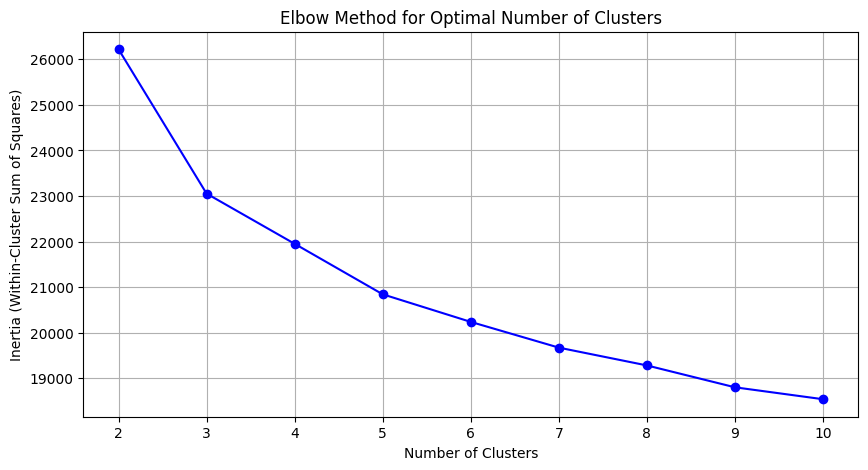

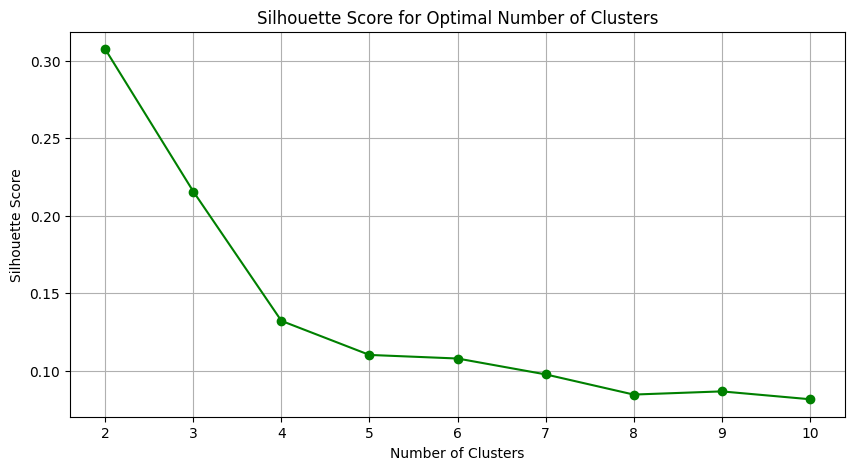

In [632]:
# Step 1: Determine the optimal number of clusters using the Elbow Method and Silhouette Score
inertia = []
silhouette_scores = []
cluster_range = range(2, 11)  # Testing clusters from 2 to 10

for n_clusters in cluster_range:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(data_final)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(data_final, kmeans.labels_))

# Plotting the Elbow Method
plt.figure(figsize=(10, 5))
plt.plot(cluster_range, inertia, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Within-Cluster Sum of Squares)')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.grid(True)
plt.show()


# Plotting the Silhouette Score
plt.figure(figsize=(10, 5))
plt.plot(cluster_range, silhouette_scores, marker='o', linestyle='-', color='g')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal Number of Clusters')
plt.grid(True)
plt.show()


 - In this plot, the elbow appears to be around 4 to 6 clusters, with 4 being a balanced choice between model simplicity and performance.

- The highest silhouette score (around 0.31) is at 2 clusters, but this might oversimplify the segmentation. A balanced choice could be 3 or 4 clusters, balancing interpretability and cluster quality. The score’s flattening trend beyond 4 clusters suggests that increasing clusters may lead to overfitting or diminishing returns.

In [644]:
# Perform KMeans clustering with 2 clusters which had the highest silhouette score
kmeans = KMeans(n_clusters=2, random_state=42)
data_final['Cluster'] = kmeans.fit_predict(data_final)

# Calculate the silhouette score for the fitted KMeans model
silhouette_avg = silhouette_score(data_final, kmeans.labels_)
print(f"The average silhouette score with 2 clusters is {silhouette_avg}")

The average silhouette score with 2 clusters is 0.3072246162668872


### 6.2. Cluster Characteristics - Socio Deomographic Data

In [645]:
# Group the data_final by the ‘Cluster’ column.
cluster_summary = data_final.groupby('Cluster').mean()
print(cluster_summary)

         yearly_income   Kidhome  Teenhome  days_recent_purchase  winespend  \
Cluster                                                                       
0            -0.812261  0.769668  0.493839              0.002249  -0.863644   
1             0.738101  0.143842  0.515935             -0.002044   0.784793   

         fruitspend  meatprodspend  fishprodspend  sweetprodspend  \
Cluster                                                             
0         -0.678318      -0.873890      -0.690775       -0.664672   
1          0.616387       0.794103       0.627707        0.603987   

         premiumprodspend  ...       age  Education_Basic  \
Cluster                    ...                              
0               -0.650239  ... -0.177695         0.049289   
1                0.590872  ...  0.161471         0.001723   

         Education_Graduation  Education_Master  Education_PhD  \
Cluster                                                          
0                    0.472038

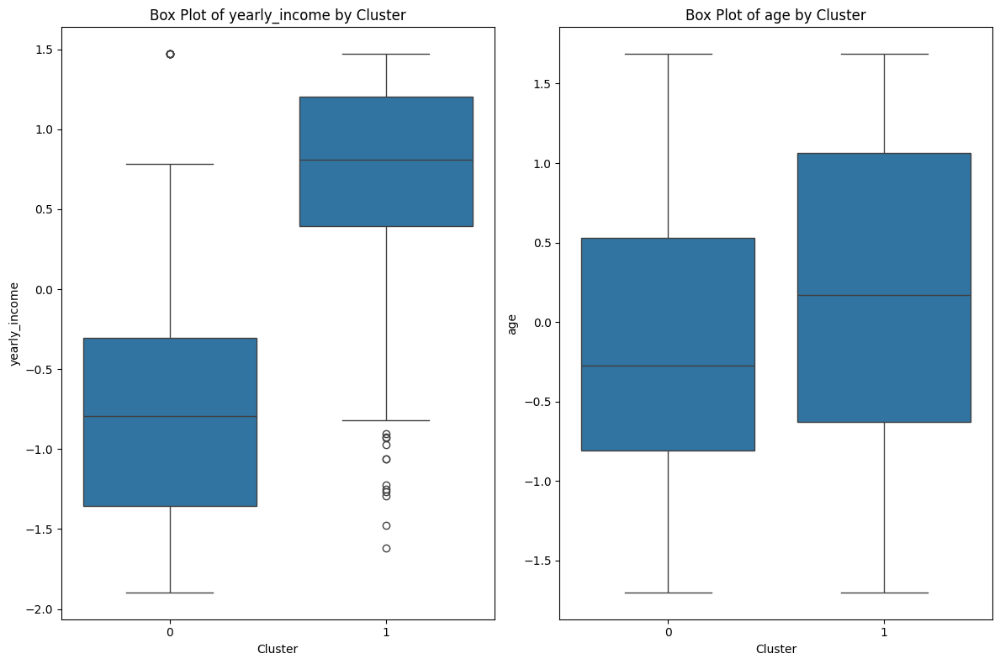

In [646]:
# Box plots of sociodemographic characteristics of the customers within each cluster

# List of features to create box plots for
socio_dem_features = ['yearly_income','age']

# Create box plots for each feature within each cluster
plt.figure(figsize=(12, 8))
for i, feature in enumerate(socio_dem_features):
    plt.subplot(1, 2, i + 1)
    sns.boxplot(x='Cluster', y=feature, data=data_final)
    plt.title(f'Box Plot of {feature} by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(feature)

plt.tight_layout()
plt.show()

Pattern:

Yearly Income by Cluster:
- Cluster 0:
  - Higher median yearly income.
  - A wider interquartile range (IQR), indicating more income variability within the cluster.
  - Several outliers on the lower end, suggesting some low-income anomalies in this group.
- Cluster 1:
  - Lower median income compared to Cluster 0.
  - Less variability in income, as shown by the narrower IQR.
  - Only a few outliers on the higher end.

Age by Cluster:
- Cluster 0:
  - Slightly higher median age, indicating this cluster may represent an older demographic.
  - A wider IQR, showing more age diversity within this cluster.
Cluster 1:
  - Lower median age, indicating a younger demographic.
  - Slightly narrower IQR, suggesting less age variability.

Cluster 0 might represent a higher income, older demographic with some low-income exceptions.

Cluster 1 might represent a younger demographic with lower but more consistent income.

Pattern:
 - cluster 0: Higher yearly income, wide age range, showing age diversity in this cluster. A more affluent segment.
 - Cluster 1: Lower yearly income, with diverse age, represents a less affluent segment, possibly younger customers or those with lower purchasing power.
  
 - Age seems less decisive in separating clusters, as both clusters cover a similar age span.

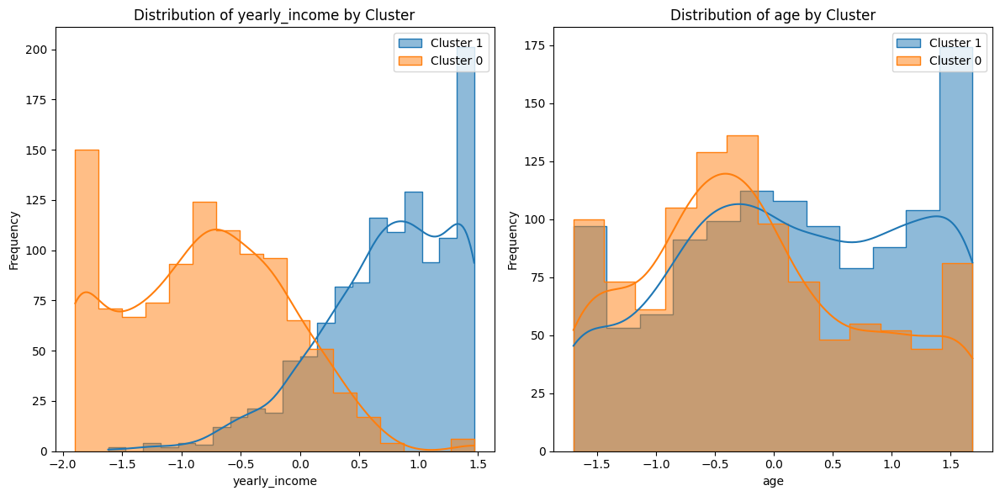

In [648]:
# Histograms of sociodemographic characteristics of the customers within each cluster

# Create histograms for each feature within each cluster
plt.figure(figsize=(12, 6))
for i, feature in enumerate(socio_dem_features):
    plt.subplot(1, 2, i + 1)
    for cluster in data_final['Cluster'].unique():
        sns.histplot(data_final[data_final['Cluster'] == cluster][feature], label=f'Cluster {cluster}', kde=True, element="step")
    plt.title(f'Distribution of {feature} by Cluster')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()

plt.tight_layout()
plt.show()

Pattern:

Cluster 0 (Blue):
- Yearly Income: a more affluent group with higher income levels.
- Age: Covers a broad age range, with a peak in middle-aged individuals.
   
Cluster 1 (Orange):
- Yearly Income: Concentrated on the lower income spectrum, showing a significant contrast with Cluster 0.
- Age: More evenly distributed across ages, suggesting a diverse age range but lower income potential.

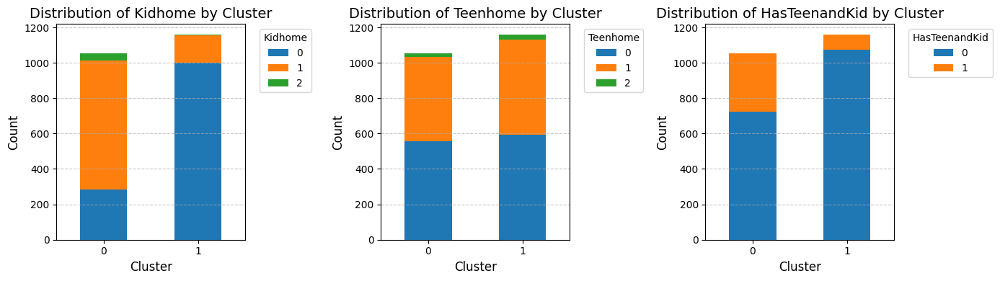

In [649]:
categorical_features = ['Kidhome', 'Teenhome', 'HasTeenandKid']

# Set up the subplot grid (3 columns, auto rows based on the number of features)
n_features = len(categorical_features)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

plt.figure(figsize=(14, n_rows * 4))

for i, feature in enumerate(categorical_features):
    plt.subplot(n_rows, n_cols, i + 1)
    
    # Count of each category per cluster
    category_cluster_distribution = data_final.groupby('Cluster')[feature].value_counts().unstack().fillna(0)
    
    # Bar chart for each categorical feature
    category_cluster_distribution.plot(kind='bar', stacked=True, ax=plt.gca(),)
    
    plt.title(f'Distribution of {feature} by Cluster', fontsize=14)
    plt.xlabel('Cluster', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=0)
    plt.legend(title=feature, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

1. Kidhome Distribution by Cluster:
- Cluster 0: Majority of customers have 1 kid
- Cluster 1: Predominantly consists of customers with no kids with a small proportion having 1 kid. 

2. Teenhome Distribution by Cluster:
- Cluster 0: Equal proportion of customers have no teenagers or 1 teenager with a very small minority having 2 teenagers
- Cluster 1: Similar to Cluster 0, but with a slightly higher proportion of customers with no teenager

3. HasTeenandKid Distribution by Cluster:
- Cluster 0: The majority of customers have no kid or teenagers with less than half having both kids and teengers
- Cluster 1: Majority of customers have no kid and teenagers with very few having both kids and teengers

Overall Cluster 0 has more kids than cluster 1.

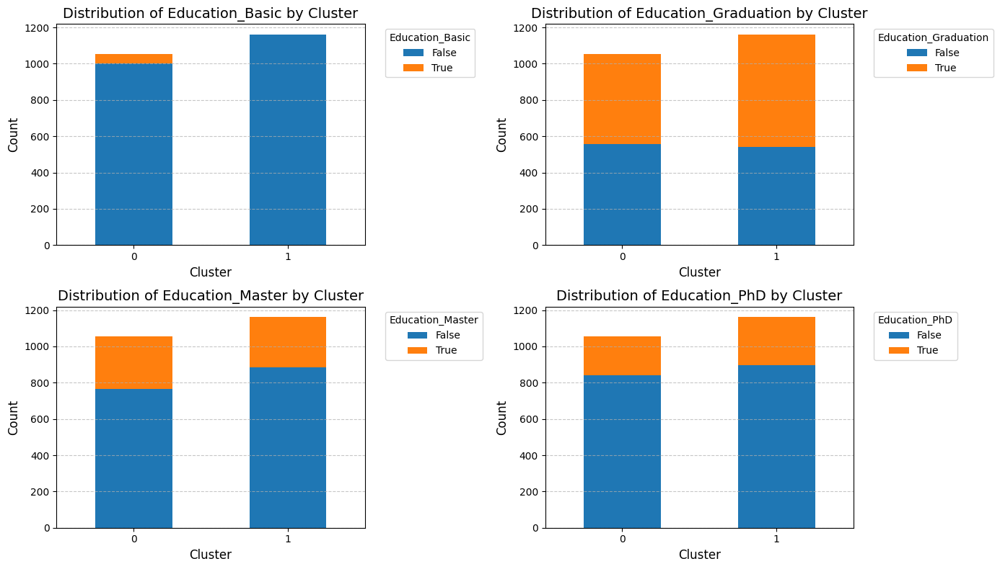

In [650]:
categorical_features_2 = ['Education_Basic', 'Education_Graduation', 'Education_Master', 'Education_PhD']

# Set up the subplot grid (2 columns, auto rows based on the number of features)
n_features = len(categorical_features_2)
n_cols = 2
n_rows = (n_features + n_cols - 1) // n_cols

plt.figure(figsize=(14, n_rows * 4))

for i, feature in enumerate(categorical_features_2):
    plt.subplot(n_rows, n_cols, i + 1)
    
    # Count of each category per cluster
    cat_cluster_distribution_2 = data_final.groupby('Cluster')[feature].value_counts().unstack().fillna(0)
    
    # Bar chart for each categorical feature
    cat_cluster_distribution_2.plot(kind='bar', stacked=True, ax=plt.gca(),)
    
    plt.title(f'Distribution of {feature} by Cluster', fontsize=14)
    plt.xlabel('Cluster', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=0)
    plt.legend(title=feature, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

- Cluster 0 - has customers with all levels of education with largest having graduation level
- Cluster 1 - has customers with graduation, master and PHD education level. There are no customers with basic education

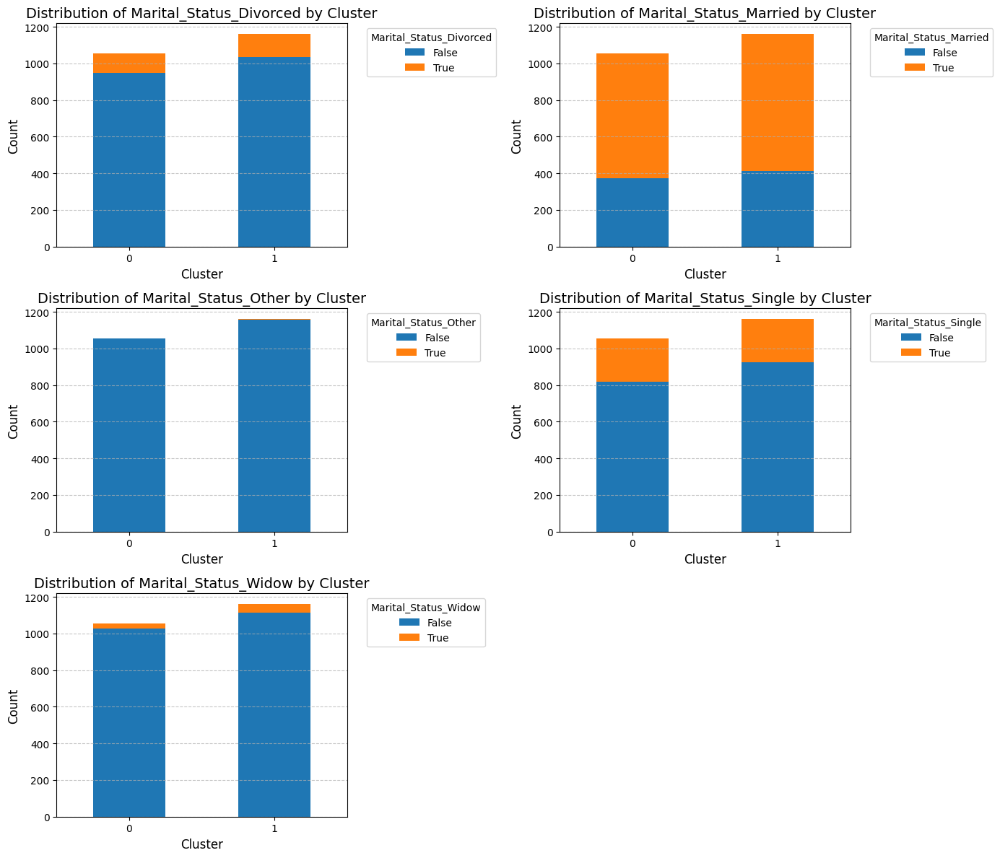

In [652]:
categorical_features_3 = ['Marital_Status_Divorced', 'Marital_Status_Married', 'Marital_Status_Other', 'Marital_Status_Single', 'Marital_Status_Widow']

# Set up the subplot grid (2 columns, auto rows based on the number of features)
n_features = len(categorical_features_3)
n_cols = 2
n_rows = (n_features + n_cols - 1) // n_cols

plt.figure(figsize=(14, n_rows * 4))

for i, feature in enumerate(categorical_features_3):
    plt.subplot(n_rows, n_cols, i + 1)
    
    # Count of each category per cluster
    cat_cluster_distribution_3 = data_final.groupby('Cluster')[feature].value_counts().unstack().fillna(0)
    
    # Bar chart for each categorical feature
    cat_cluster_distribution_3.plot(kind='bar', stacked=True, ax=plt.gca(),)
    
    plt.title(f'Distribution of {feature} by Cluster', fontsize=14)
    plt.xlabel('Cluster', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=0)
    plt.legend(title=feature, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

- cluster 0 - has all marital statuses except other marital status. Married customers are the most.
- cluster 1 - has all marital statuses, with married customers being the most.

###  6.3 Cluster characteristics - Spending Behaviour

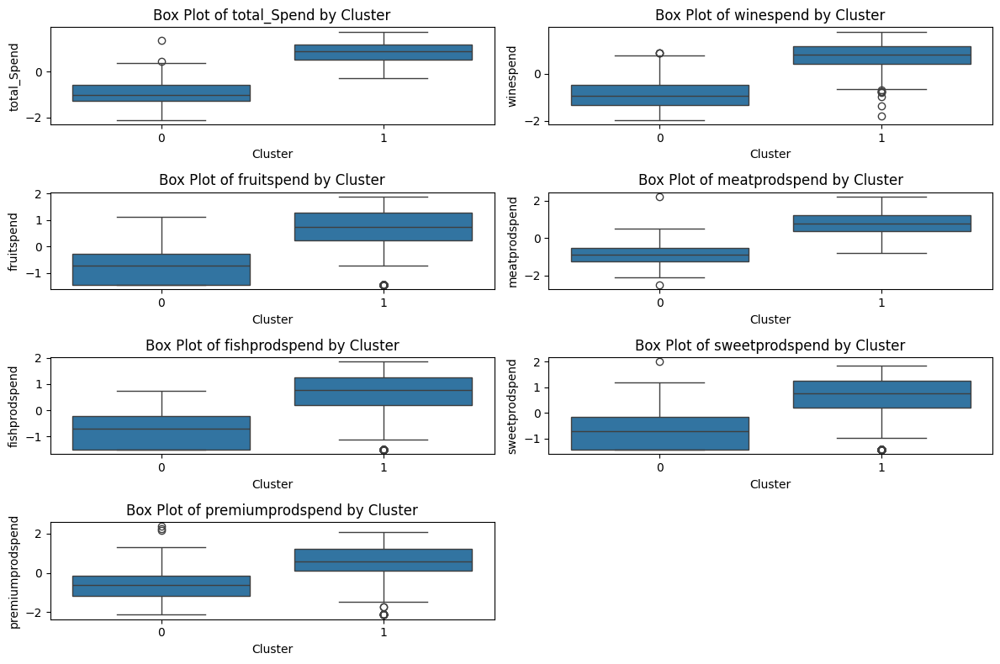

In [653]:
# Box plots of spending behaviour of the customers within each cluster

# List of features to create box plots for
spend_features= ['total_Spend', 'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend', 'sweetprodspend', 'premiumprodspend']

# Create box plots for each feature within each cluster
plt.figure(figsize=(12, 8))
for i, feature in enumerate(spend_features):
    plt.subplot(4,2, i + 1)
    sns.boxplot(x='Cluster', y=feature, data=data_final)
    plt.title(f'Box Plot of {feature} by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(feature)

plt.tight_layout()
plt.show()

- Cluster 0 - have lower total spend with lowest spend on fruits, fish products and sweets
- Cluster 1 - have higher total spend with highest spend on wines, fruits, meat products, fish products, sweets and premium products.

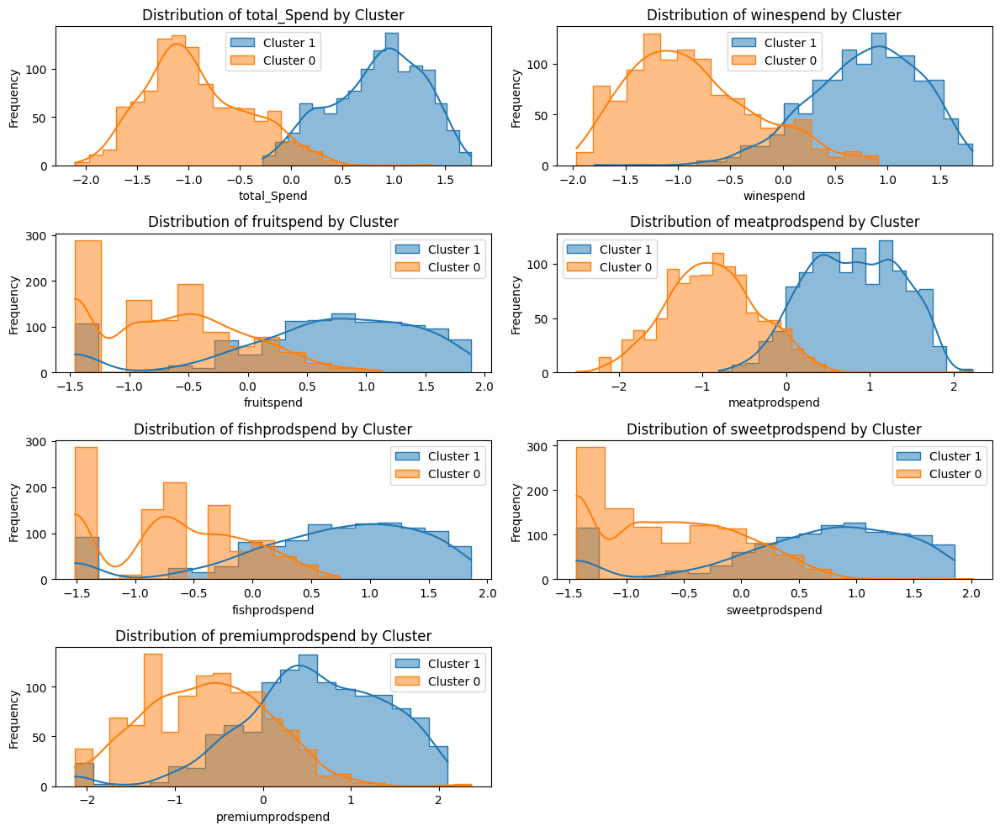

In [654]:
# Histograms of spending behaviour of the customers within each cluster

# Create histograms for each feature within each cluster
plt.figure(figsize=(12, 10))
for i, feature in enumerate(spend_features):
    plt.subplot(4, 2, i + 1)
    for cluster in data_final['Cluster'].unique():
        sns.histplot(data_final[data_final['Cluster'] == cluster][feature], label=f'Cluster {cluster}', kde=True, element="step")
    plt.title(f'Distribution of {feature} by Cluster')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()

plt.tight_layout()
plt.show()

- Cluster 0 - have lower total spend with lowest spend on fruits, fish products and sweets
- Cluster 1 - have higher total spend with highest spend on wines and meat products

'winespend', 'fruitspend', 'meatprodspend', 'fishprodspend', 'sweetprodspend', 'premiumprodspend'

### 6.4 Cluster characteristics - Purchasing behaviour 

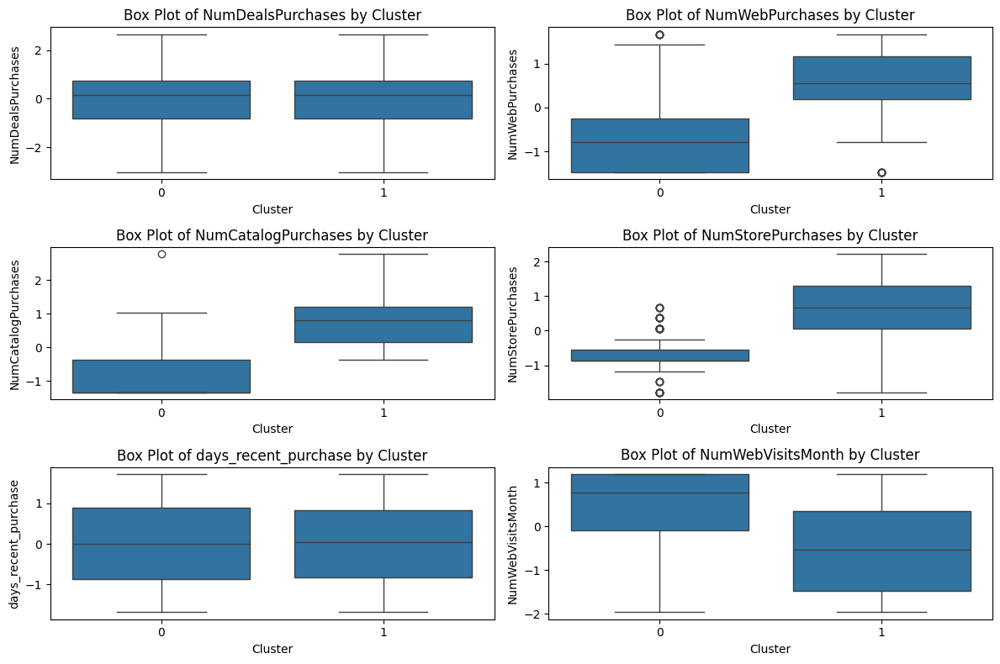

In [655]:
# Box plots of spending behaviour of the customers within each cluster

# List of features to create box plots for
purchase_features= ['NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','days_recent_purchase','NumWebVisitsMonth']

# Create box plots for each feature within each cluster
plt.figure(figsize=(12, 8))
for i, feature in enumerate(purchase_features):
    plt.subplot(3,2, i + 1)
    sns.boxplot(x='Cluster', y=feature, data=data_final)
    plt.title(f'Box Plot of {feature} by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(feature)

plt.tight_layout()
plt.show()

- Cluster 0 - Low number of web purchases, catalog purchases and low number of store purchases. Have high number of web visits per month.
- Cluster 1 - Relatively high number of web purchases, catalogPurchases and store purchases.
- For both clusters, there is no difference in number of deals purchases and days_recent purchase.

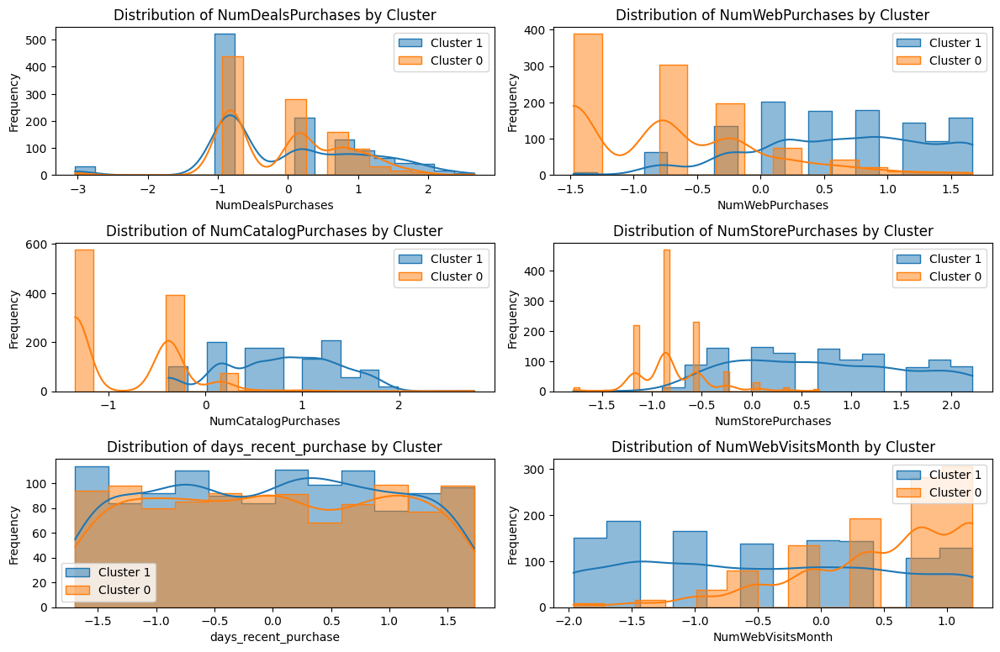

In [656]:
# Histograms of spending behaviour of the customers within each cluster

# Create histograms for each feature within each cluster
plt.figure(figsize=(12, 10))
for i, feature in enumerate(purchase_features):
    plt.subplot(4, 2, i + 1)
    for cluster in data_final['Cluster'].unique():
        sns.histplot(data_final[data_final['Cluster'] == cluster][feature], label=f'Cluster {cluster}', kde=True, element="step")
    plt.title(f'Distribution of {feature} by Cluster')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()

plt.tight_layout()
plt.show()

- Cluster 0 - Low number of web purchases, catalog purchases and low number of store purchases. Have high number of web visits per month.
- Cluster 1 - Relatively high number of web purchases, catalogPurchases and store purchases. Tend to have lower number of web visits per month.
- For both clusters, there is no difference in number of deals purchases and days_recent purchase.

### 6.5 Cluster characteristics - Promotions acceptance

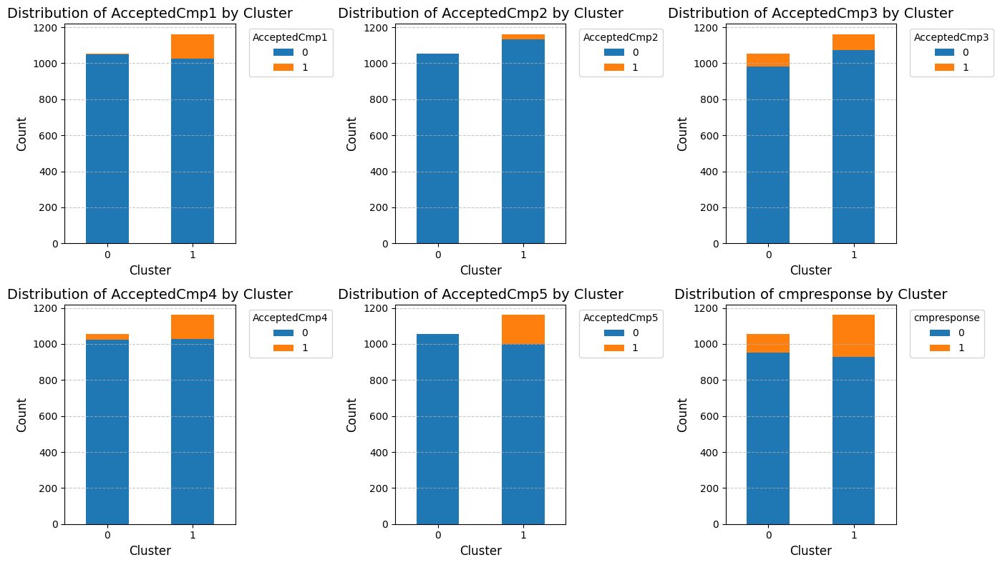

In [657]:
# Box plots of spending behaviour of the customers within each cluster

# List of features to create box plots for
promotion_features= ['AcceptedCmp1','AcceptedCmp2','AcceptedCmp3', 'AcceptedCmp4','AcceptedCmp5','cmpresponse']

# Set up the subplot grid (2 columns, auto rows based on the number of features)
n_features = len(promotion_features)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

plt.figure(figsize=(14, n_rows * 4))

for i, feature in enumerate(promotion_features):
    plt.subplot(n_rows, n_cols, i + 1)
    
    # Count of each category per cluster
    promotion_features_distribution = data_final.groupby('Cluster')[feature].value_counts().unstack().fillna(0)
    
    # Bar chart for each categorical feature
    promotion_features_distribution.plot(kind='bar', stacked=True, ax=plt.gca(),)
    
    plt.title(f'Distribution of {feature} by Cluster', fontsize=14)
    plt.xlabel('Cluster', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=0)
    plt.legend(title=feature, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


- Cluster 1 - Tend to slighlty accept promotional campaigns than customers in cluster 0.

### 6.6 Cluster characteristics - time from enrollment to company

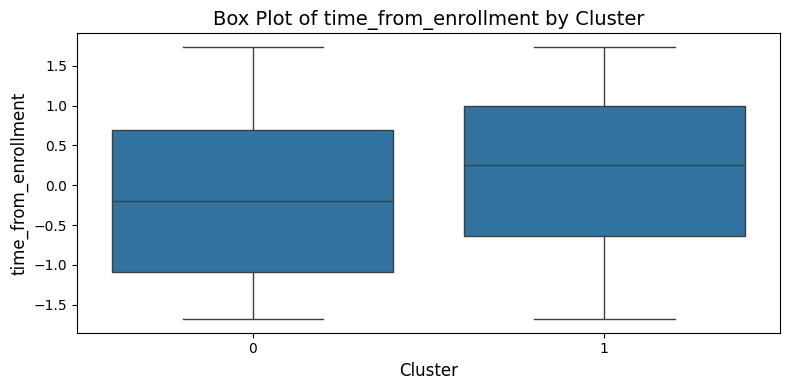

In [658]:
# Specify the feature to plot
feature = 'time_from_enrollment'

# Plotting the box plot for the selected feature
plt.figure(figsize=(8, 4))
sns.boxplot(x='Cluster', y=feature, data=data_final)
plt.title(f'Box Plot of {feature} by Cluster', fontsize=14)
plt.xlabel('Cluster', fontsize=12)
plt.ylabel(feature, fontsize=12)
plt.tight_layout()
plt.show()

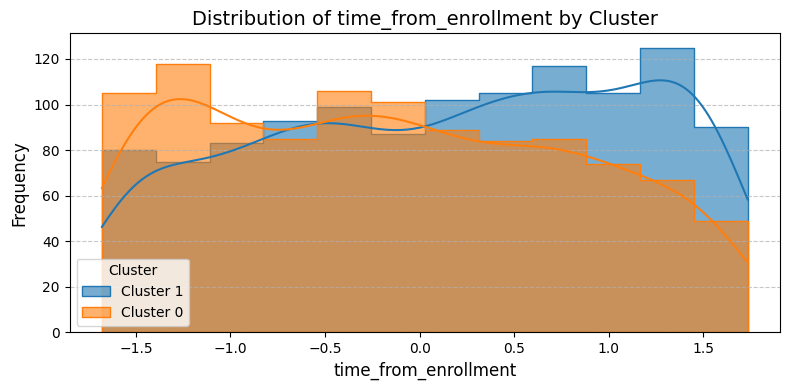

In [659]:
# Plotting the histogram for the selected feature
plt.figure(figsize=(8, 4))
for cluster in data_final['Cluster'].unique():
    sns.histplot(data_final[data_final['Cluster'] == cluster][feature], label=f'Cluster {cluster}', kde=True, element="step", alpha=0.6)

plt.title(f'Distribution of {feature} by Cluster', fontsize=14)
plt.xlabel(feature, fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend(title='Cluster')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

 - Cluster 0 - Have slightly more customers who have been enrolled for fewer months into the company
 - Cluster 1 - Have slightly more customers who have been enrolled for more months into the company

### 6.7 Cluster characteristics - complaints

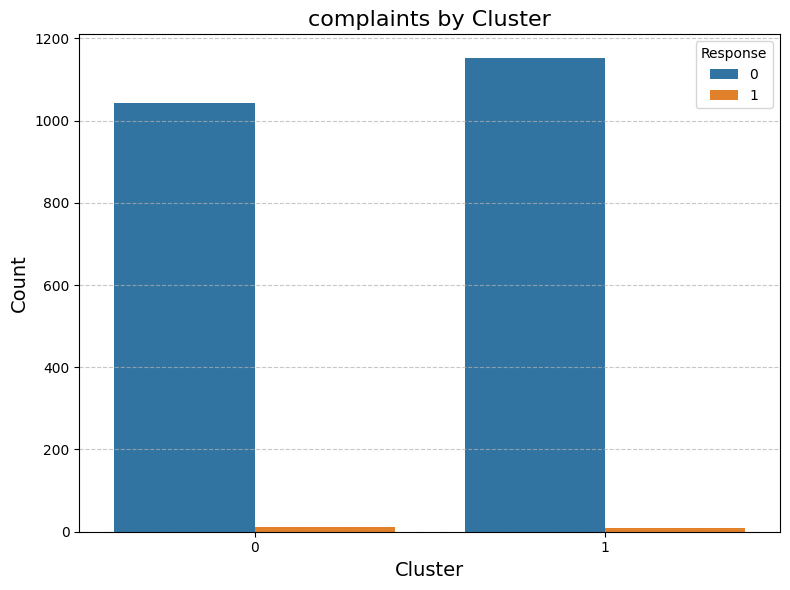

In [660]:
# Define a single feature for visualization
cat_feature = 'complaints'

# Improved visualization for a single feature
plt.figure(figsize=(8, 6))

sns.countplot(data=data_final, x='Cluster', hue=cat_feature)
plt.title(f'{cat_feature} by Cluster', fontsize=16)
plt.xlabel('Cluster', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Response', loc='upper right', bbox_to_anchor=(1, 1))
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Not much difference in the customers with complaints between the clusters.

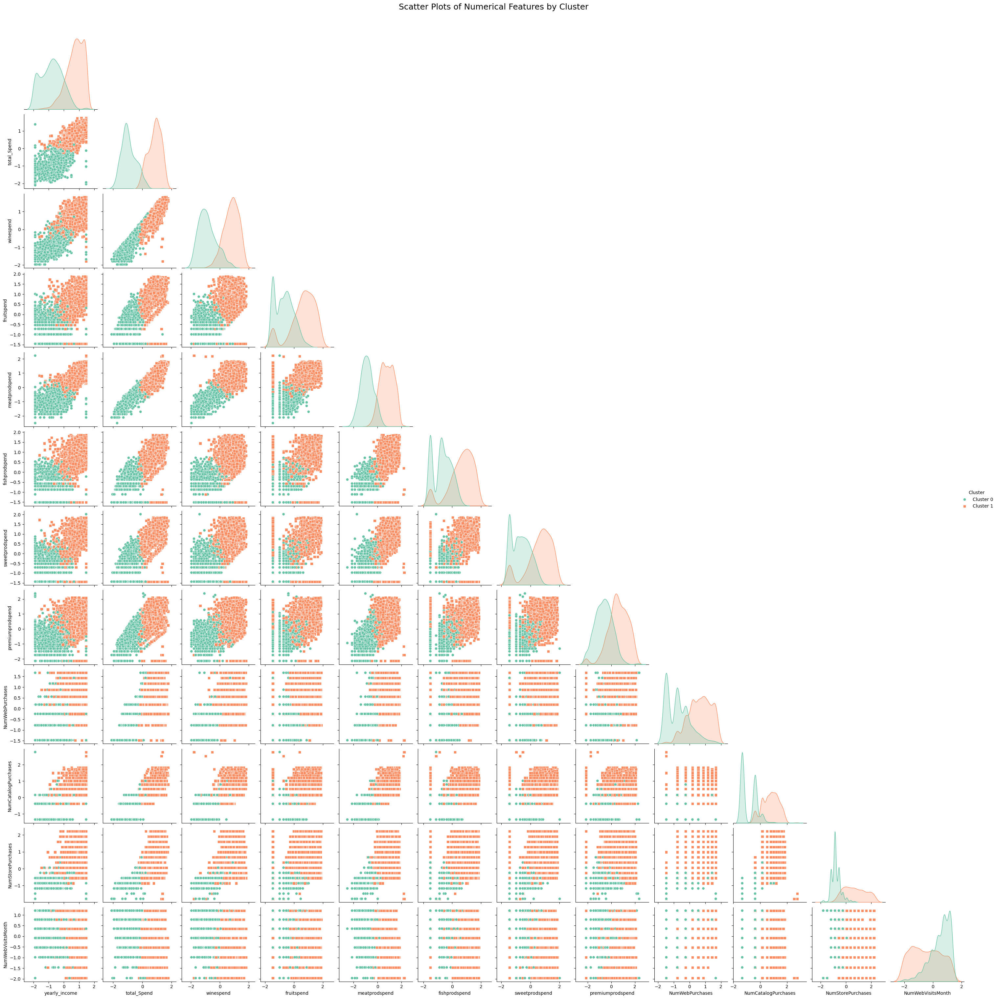

In [682]:
# List of numerical features to plot
numerical_features = ['yearly_income','total_Spend', 'winespend', 'fruitspend', 'meatprodspend', 
                    'fishprodspend', 'sweetprodspend', 'premiumprodspend',
                    'NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth']

# Pairplot of numerical features with cluster hue
pairplot = sns.pairplot(data_final[numerical_features + ['Cluster']], 
                        hue='Cluster', 
                        palette='Set2', 
                        corner=True,
                        diag_kind='kde', 
                        markers=["o", "s"])

# Add a legend with clear labels
pairplot._legend.set_title('Cluster')
for t, l in zip(pairplot._legend.texts, ['Cluster 0', 'Cluster 1']):
    t.set_text(l)

plt.suptitle('Scatter Plots of Numerical Features by Cluster', y=1.02, fontsize=18)
plt.show()

### 6.8 Cluster Sizes

Cluster Sizes and Percentages:
         Size  Percentage
Cluster                  
0        1055       47.61
1        1161       52.39


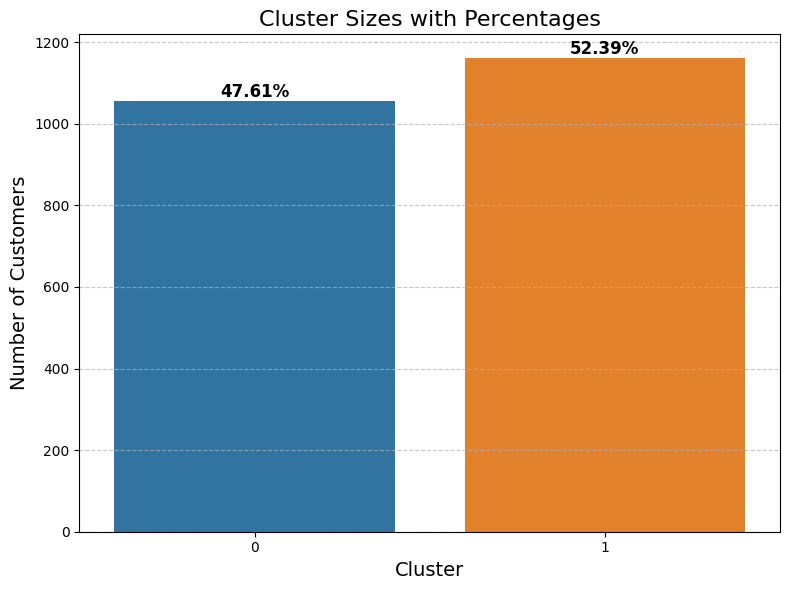

In [661]:
# Calculate the size of each cluster
cluster_sizes = data_final['Cluster'].value_counts().sort_index()

# Calculate percentages for each cluster
cluster_percentages = (cluster_sizes / cluster_sizes.sum() * 100).round(2)

# Display cluster sizes and percentages
print("Cluster Sizes and Percentages:")
print(pd.DataFrame({'Size': cluster_sizes, 'Percentage': cluster_percentages}))

# Prepare data for plotting
cluster_data = pd.DataFrame({
    'Cluster': cluster_sizes.index.astype(str),  # Convert index to string to avoid issues with hue
    'Size': cluster_sizes.values,
    'Percentage': cluster_percentages.values
})

# Visualize cluster sizes with a bar plot including percentages
plt.figure(figsize=(8, 6))
bars = sns.barplot(data=cluster_data, x='Cluster', y='Size', hue='Cluster') # Assign x variable to hue

plt.title('Cluster Sizes with Percentages', fontsize=16)
plt.xlabel('Cluster', fontsize=14)
plt.ylabel('Number of Customers', fontsize=14)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add percentage labels on top of the bars
for bar, percentage in zip(bars.patches, cluster_percentages):
    plt.annotate(f'{percentage}%', 
                 (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                 ha='center', va='bottom', fontsize=12, color='black', fontweight='bold')

plt.tight_layout()
plt.show()

Cluster 1 is bigger than cluster 0